# Merge e check dell'intero df

### Import e merge

In [1]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import math
import scorecardpy as sc
import scipy.stats.contingency as scp_cont

from matplotlib import pyplot as plt
from IPython.display import display


In [2]:
pd.options.display.max_columns = 999
pd.options.display.max_rows = 999

In [3]:
#importo i df delle centraline

data_dir = os.path.join("..", "data")

df_SF = pd.read_parquet(os.path.join(data_dir, "df_SF.parquet"))
df_VC = pd.read_parquet(os.path.join(data_dir, "df_VC.parquet"))
df_GM = pd.read_parquet(os.path.join(data_dir, "df_GM.parquet"))

In [4]:
#importo i df del meteo

filedaily_path = os.path.join(data_dir, 'daily_df.parquet')
daily_df = pd.read_parquet(filedaily_path, engine = 'pyarrow')

In [5]:
# Seleziono solo le colonne utili e rinomino PM10
df_SF = df_SF[['giorno', 'PM10']]
df_VC = df_VC[['giorno', 'PM10']]
df_GM = df_GM[['giorno', 'PM10']]

# Merge dei tre dataframe su 'giorno'
df_unito = pd.concat([df_SF, df_VC, df_GM], axis=0)

print(df_unito.head())

       giorno  PM10
0  2024-01-01  24.0
1  2024-01-02  24.0
2  2024-01-03  32.0
3  2024-01-04  33.0
4  2024-01-05  39.0


In [6]:
daily_df.info()

<class 'pandas.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 53 columns):
 #   Column                             Non-Null Count  Dtype         
---  ------                             --------------  -----         
 0   date                               731 non-null    datetime64[ms]
 1   temperature_2m_mean                731 non-null    float32       
 2   temperature_2m_max                 731 non-null    float32       
 3   temperature_2m_min                 731 non-null    float32       
 4   apparent_temperature_mean          731 non-null    float32       
 5   apparent_temperature_max           731 non-null    float32       
 6   apparent_temperature_min           731 non-null    float32       
 7   wind_speed_10m_max                 731 non-null    float32       
 8   wind_gusts_10m_max                 731 non-null    float32       
 9   wind_direction_10m_dominant        731 non-null    float32       
 10  shortwave_radiation_sum            731 non-null  

In [7]:
df_unito['giorno'] = pd.to_datetime(df_unito['giorno'])

In [8]:
df_finale = df_unito.merge(daily_df, left_on='giorno', right_on='date', how='left')

### V-score e drop della variabile 'rain'

In [9]:
list_var_num = df_finale.select_dtypes(include=['float32', 'float64']).columns.tolist()
list_non_numeriche = [col for col in df_finale.columns if (col not in list_var_num) & (col != 'giorno') & (col != 'date')]


In [10]:
df_vscore = df_finale.copy()

for k in list_var_num :   # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                     # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].dropna().unique()))}) # ... resetting labels

In [11]:
list_vscores = []

list_vars_vscore = list_var_num + list_non_numeriche
list_vars_vscore = list(df_vscore[list_vars_vscore].nunique().sort_values(ascending=False).index)

for ii, i in enumerate(list_vars_vscore[:-1]) :
    for jj, j in enumerate(list_vars_vscore[ii+1:]) :

        df_contingency = df_vscore.groupby([i,j]).agg({'giorno':'count'})
        df_contingency = df_contingency.unstack().replace(0, np.nan)
        df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
        df_contingency = df_contingency.fillna(0).astype(int)

        r, c = df_contingency.shape
        n = df_contingency.sum().sum()

        vscore = scp_cont.association(df_contingency.values, method="tschuprow")
        vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
        vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
        vscore = np.sqrt(vscore)

        list_vscores.append([i,j,vscore])

df_vscore = pd.DataFrame(list_vscores, columns=['varA', 'varB', 'v-score'])
df_vscore = df_vscore.sort_values('v-score', ascending=False)

c:\Users\Boom\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\scipy\stats\contingency.py:519: RuntimeWarning: invalid value encountered in scalar divide
  value = phi2 / math.sqrt((n_rows - 1) * (n_cols - 1))
C:\Users\Boom\AppData\Local\Temp\ipykernel_14568\1252610172.py:19: RuntimeWarning: invalid value encountered in scalar divide
  vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
c:\Users\Boom\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\scipy\stats\contingency.py:519: RuntimeWarning: invalid value encountered in scalar divide
  value = phi2 / math.sqrt((n_rows - 1) * (n_cols - 1))
C:\Users\Boom\AppData\Local\Temp\ipykernel_14568\1252610172.py:19: RuntimeWarning: invalid value encountered in scalar divide
  vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
c:\Users\Boom\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\scipy\stats\contingency.py:519: RuntimeWarning: invalid value encountered in scalar divide
  value = phi2 / math.sqrt((n_rows 

In [12]:
df_vscore.head(10).style.background_gradient(vmin=0, vmax=1).format(precision=2)

,varA,varB,v-score
1350,precipitation_sum,rain_sum,1.00
972,pressure_msl_mean,surface_pressure_mean,0.84
1064,pressure_msl_min,surface_pressure_min,0.84
1042,surface_pressure_max,pressure_msl_max,0.83
62,sunrise_minutes,daylight_duration,0.74
11,sunset_minutes,daylight_duration,0.74
169,temperature_2m_mean,apparent_temperature_mean,0.70
1354,precipitation_sum,weather_description,0.70
1360,rain_sum,weather_description,0.70
309,apparent_temperature_min,temperature_2m_min,0.66


In [13]:
# faccio un check perchè le prime due variabili hanno correlazione massima 
df_pivot = pd.pivot_table(df_finale,
                          index='rain_sum', columns='precipitation_sum',
                          values='giorno', aggfunc='count', fill_value=0)
df_pivot = df_pivot.div(df_pivot.sum(axis=0), axis=1)
# df_pivot.style.background_gradient(vmin=0, vmax=.4).format(precision=2)

In [14]:
df_finale['rain_sum'].describe()

count    2090.000000
mean        2.545885
std         6.458168
min         0.000000
25%         0.000000
50%         0.000000
75%         1.700000
max        59.399998
Name: rain_sum, dtype: float64

In [15]:
df_finale['precipitation_sum'].describe()

count    2090.000000
mean        2.558660
std         6.528005
min         0.000000
25%         0.000000
50%         0.000000
75%         1.700000
max        59.399998
Name: precipitation_sum, dtype: float64

In [16]:
df_finale = df_finale.drop(['rain_sum','date'],axis=1)

### Correlazioni e check variabile 'snow'

In [17]:
corr_matrix = df_finale.corr(numeric_only=True)

list_corr = []
cols = corr_matrix.columns.tolist()

for ii, i in enumerate(cols[:-1]):
    for jj, j in enumerate(cols[ii+1:]):
        list_corr.append([i, j, corr_matrix.loc[i, j]])

df_corr = pd.DataFrame(list_corr, columns=['varA', 'varB', 'correlation'])
df_corr = df_corr.sort_values('correlation', ascending=False, key=abs)

df_corr.loc[df_corr['correlation'] > 0.98,:]

,varA,varB,correlation
666,snowfall_sum,snowfall_water_equivalent_sum,1.000000
1200,pressure_msl_mean,surface_pressure_mean,0.999511
1222,pressure_msl_max,surface_pressure_max,0.999449
1232,pressure_msl_min,surface_pressure_min,0.999400
52,temperature_2m_mean,apparent_temperature_mean,0.996132
149,temperature_2m_min,apparent_temperature_min,0.994413
80,temperature_2m_mean,soil_temperature_0_to_7cm_mean,0.994388
101,temperature_2m_max,apparent_temperature_max,0.994272
1086,soil_temperature_0_to_100cm_mean,soil_temperature_28_to_100cm_mean,0.993133
1105,soil_temperature_0_to_7cm_mean,soil_temperature_7_to_28cm_mean,0.992980


In [18]:
corr_matrix = df_finale.corr(numeric_only=True, method='spearman')

list_corr = []
cols = corr_matrix.columns.tolist()

for ii, i in enumerate(cols[:-1]):
    for jj, j in enumerate(cols[ii+1:]):
        list_corr.append([i, j, corr_matrix.loc[i, j]])

df_corr = pd.DataFrame(list_corr, columns=['varA', 'varB', 'correlation'])
df_corr = df_corr.sort_values('correlation', ascending=False, key=abs)

df_corr.loc[df_corr['correlation'] > 0.98,:]

,varA,varB,correlation
666,snowfall_sum,snowfall_water_equivalent_sum,1.000000
1200,pressure_msl_mean,surface_pressure_mean,0.999344
1232,pressure_msl_min,surface_pressure_min,0.999234
1222,pressure_msl_max,surface_pressure_max,0.999110
52,temperature_2m_mean,apparent_temperature_mean,0.996333
149,temperature_2m_min,apparent_temperature_min,0.995029
80,temperature_2m_mean,soil_temperature_0_to_7cm_mean,0.994720
101,temperature_2m_max,apparent_temperature_max,0.994637
303,apparent_temperature_min,wet_bulb_temperature_2m_min,0.993742
212,apparent_temperature_mean,wet_bulb_temperature_2m_mean,0.992911


In [19]:
# vediamo che snowfall_sum e snowfall_water_equivalent_sum hanno correlazione massima

df_finale['snowfall_sum'].describe()

count    2090.000000
mean        0.008943
std         0.175232
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         4.480000
Name: snowfall_sum, dtype: float64

In [20]:
df_finale['snowfall_water_equivalent_sum'].describe()

count    2090.000000
mean        0.012775
std         0.250331
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         6.400000
Name: snowfall_water_equivalent_sum, dtype: float64

# Controlli delle associazioni per gruppi di variabili


## Intro


Per ogni gruppo di variabili cerco di capire quali siano molto correlate/associate tra loro.

Per capire la correlazione tra loro studio:
+ Correlazione di Pearson
+ Correlazione di Spearman
+ v-score
+ Scatter plot tra loro

Cerco di raggruppare variabili molto correlate e tra quelle ne seleziono una.

Per scegliere quale variabile selezionare le confronto con il PM10.

Creo la variabile dicotomica PM10.

Per capire la correlazione con PM10 studio:
+ Correlazione di Pearson
+ Correlazione di Spearman
+ v-score
+ Scatter plot
+ Information Value
+ Ragionamento dietro le scelte

In [21]:
# creo la flag PM10

df_finale['target_pm10'] = df_finale['PM10'] > 50
df_finale["target_pm10"] = df_finale["target_pm10"].map({True: 1, False: 0})

df_finale.target_pm10.value_counts()

target_pm10
0    1997
1      93
Name: count, dtype: int64

### Gruppi

In [22]:
groups = {  
    'temperature': [
        'temperature_2m_mean', 'temperature_2m_max', 'temperature_2m_min',
        'apparent_temperature_mean', 'apparent_temperature_max', 'apparent_temperature_min',
        'wet_bulb_temperature_2m_mean', 'wet_bulb_temperature_2m_max', 'wet_bulb_temperature_2m_min',
        'dew_point_2m_mean', 'dew_point_2m_max', 'dew_point_2m_min'
    ],
    'wind': [
        'wind_speed_10m_mean', 'wind_speed_10m_max', 'wind_speed_10m_min',
        'wind_gusts_10m_mean', 'wind_gusts_10m_max', 'wind_gusts_10m_min',
        'wind_direction_10m_dominant'
    ],
    'precipitation': [
        'precipitation_sum', 'precipitation_hours',
        'snowfall_sum', 'snowfall_water_equivalent_sum'
    ],
    'radiation_sunlight': [
        'shortwave_radiation_sum', 'sunshine_duration',
        'daylight_duration', 'sunrise_minutes', 'sunset_minutes'
    ],
    'dew_pressure': [
        'relative_humidity_2m_mean', 'relative_humidity_2m_max', 'relative_humidity_2m_min',
        'vapour_pressure_deficit_max',
        'pressure_msl_mean', 'pressure_msl_max', 'pressure_msl_min',
        'surface_pressure_mean', 'surface_pressure_max', 'surface_pressure_min'
    ],
    'cloud': [
        'cloud_cover_mean', 'cloud_cover_max', 'cloud_cover_min'
    ],
    'soil': [
        'soil_temperature_0_to_7cm_mean', 'soil_temperature_7_to_28cm_mean',
        'soil_temperature_28_to_100cm_mean', 'soil_temperature_0_to_100cm_mean',
        'soil_moisture_0_to_7cm_mean', 'soil_moisture_7_to_28cm_mean',
        'soil_moisture_28_to_100cm_mean', 'soil_moisture_0_to_100cm_mean'
    ],
    'evotraspiration': [
        'et0_fao_evapotranspiration'
    ],
    'others': [
        'weather_code'
    ]
}

### Scelta delle variabili giustificando la storia

https://www.arpae.it/it/temi-ambientali/aria/dati-qualita-aria/rete-monitoraggio

https://apps.arpae.it/qualita-aria/bollettino-qa-provinciale/bo

Le stazioni sono di tre tipi diversi: fare tre modelli potrebbe essere interessante per capire se il modello è più efficace se suddiviso in traffico/urbana o se lavora meglio se mettiamo più dati.

Infatti la centralina di San Felice è quella con più variabili perchè sono misurazioni anche di inquinanti da traffico, che nelle altre non vengono rilevati. Si potrebbero fare dunque due dataset: uno che unisce VC e GM e uno che misura SF.

+ PM10 → polveri sottili (≤10 μm). Indicano inquinamento da traffico, riscaldamento e industrie. Impattano i polmoni.
+ PM2.5 → polveri molto fini (≤2.5 μm). Più pericolose perché arrivano in profondità nei polmoni e nel sangue.
+ NO₂ (biossido di azoto) → gas da traffico e combustioni. Indica inquinamento urbano e irrita le vie respiratorie.
+ O₃ (ozono) → si forma con sole + inquinanti. Indica smog fotochimico ed è irritante per occhi e polmoni.
+ Benzene C6H6 → derivato dei carburanti. Indica inquinamento da benzina ed è cancerogeno.
+ CO (monossido di carbonio) → combustione incompleta (auto, stufe). Riduce il trasporto di ossigeno nel sangue.


Per quanto riguarda il dataset sul meteo qui trovi i significati delle variabili https://open-meteo.com/en/docs/historical-weather-api#api_documentation 

Devi:

per ogni gruppo di variabile devi fare un elenco di analisi: v-score, correlazione, grafici, v-score con pm10
poi scegliere 2/3 variabili per gruppo
pensando anche a un ragionamento/storia che ci sta dietro

COMMENTO A POSTERIORI: è interessante notare come spesso per l'IV le variabili più predittive siano _max, cosa coerente considerando che noi abbiamo una target settata sul superamento di una soglia.

## Pressure

In [23]:
# faccio un check per le variabili che hanno v-score molto alto, che sono quelle sulla pressure
list_pressure = ['relative_humidity_2m_mean', 'relative_humidity_2m_max', 'relative_humidity_2m_min',
                 'vapour_pressure_deficit_max','pressure_msl_mean', 'pressure_msl_max', 'pressure_msl_min',
                 'surface_pressure_mean', 'surface_pressure_max', 'surface_pressure_min']

### Correlazione di Pearson

In [24]:
# correlazione tra le variabili

corr_matrix = df_finale[list_pressure].corr(numeric_only=True, method='pearson')

list_corr = []
cols = corr_matrix.columns.tolist()

for ii, i in enumerate(cols[:-1]):
    for jj, j in enumerate(cols[ii+1:]):
        list_corr.append([i, j, corr_matrix.loc[i, j]])

df_corr = pd.DataFrame(list_corr, columns=['varA', 'varB', 'correlation'])
df_corr = df_corr.sort_values('correlation', ascending=False, key=abs)

df_corr.loc[df_corr['correlation'] > 0.98,:]

,varA,varB,correlation
32,pressure_msl_mean,surface_pressure_mean,0.999511
37,pressure_msl_max,surface_pressure_max,0.999449
41,pressure_msl_min,surface_pressure_min,0.999400
39,pressure_msl_min,surface_pressure_mean,0.983700
31,pressure_msl_mean,pressure_msl_min,0.982013
43,surface_pressure_mean,surface_pressure_min,0.981468


### Correlazione di Spearman

In [25]:
corr_matrix = df_finale[list_pressure].corr(numeric_only=True, method='spearman')

list_corr = []
cols = corr_matrix.columns.tolist()

for ii, i in enumerate(cols[:-1]):
    for jj, j in enumerate(cols[ii+1:]):
        list_corr.append([i, j, corr_matrix.loc[i, j]])

df_corr = pd.DataFrame(list_corr, columns=['varA', 'varB', 'correlation'])
df_corr = df_corr.sort_values('correlation', ascending=False, key=abs)

df_corr.loc[df_corr['correlation'] > 0.98,:]

,varA,varB,correlation
32,pressure_msl_mean,surface_pressure_mean,0.999344
41,pressure_msl_min,surface_pressure_min,0.999234
37,pressure_msl_max,surface_pressure_max,0.999110
39,pressure_msl_min,surface_pressure_mean,0.984000
31,pressure_msl_mean,pressure_msl_min,0.982328
43,surface_pressure_mean,surface_pressure_min,0.982288


### v-score

In [26]:
df_vscore = df_finale.copy()

for k in list_pressure :   # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                     # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].unique()))}) # ... resetting labels

In [27]:
list_vscores = []

list_vars_vscore = list_pressure
list_vars_vscore = list(df_vscore[list_vars_vscore].nunique().sort_values(ascending=False).index)

for ii, i in enumerate(list_vars_vscore[:-1]) :
    for jj, j in enumerate(list_vars_vscore[ii+1:]) :

        df_contingency = df_vscore.groupby([i,j]).agg({'giorno':'count'})
        df_contingency = df_contingency.unstack().replace(0, np.nan)
        df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
        df_contingency = df_contingency.fillna(0).astype(int)

        r, c = df_contingency.shape
        n = df_contingency.sum().sum()

        vscore = scp_cont.association(df_contingency.values, method="tschuprow")
        vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
        vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
        vscore = np.sqrt(vscore)

        list_vscores.append([i,j,vscore])

df_vscore = pd.DataFrame(list_vscores, columns=['varA', 'varB', 'v-score'])
df_vscore = df_vscore.sort_values('v-score', ascending=False)

In [28]:
df_vscore.head(20).style.background_gradient(vmin=0, vmax=1).format(precision=2)

,varA,varB,v-score
32,pressure_msl_mean,surface_pressure_mean,0.84
22,pressure_msl_min,surface_pressure_min,0.84
35,pressure_msl_max,surface_pressure_max,0.83
18,pressure_msl_min,pressure_msl_mean,0.58
31,pressure_msl_mean,surface_pressure_max,0.57
30,pressure_msl_mean,pressure_msl_max,0.57
21,pressure_msl_min,surface_pressure_mean,0.57
42,surface_pressure_mean,surface_pressure_min,0.57
39,surface_pressure_max,surface_pressure_mean,0.56
33,pressure_msl_mean,surface_pressure_min,0.55


In [29]:
# ora guardo il vscore a tre
df_vscore = df_finale.copy()

for k in list_pressure :   # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                     # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].unique()))}) # ... resetting labels

In [30]:
list_vscores = []

list_vars_vscore = list_pressure
list_vars_vscore = list(df_vscore[list_vars_vscore].nunique().sort_values(ascending=False).index)

for ii, i in enumerate(list_vars_vscore[:-2]) :
    for jj, j in enumerate(list_vars_vscore[ii+1:-1]) :
        for kk, k in enumerate(list_vars_vscore[ii+jj+2:]) :

            df_contingency = df_vscore.groupby([i,j,k]).agg({'giorno':'count'})
            df_contingency = df_contingency.unstack().replace(0, np.nan)
            df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
            df_contingency = df_contingency.fillna(0).astype(int)

            r, c = df_contingency.shape
            n = df_contingency.sum().sum()

            #vscore = scp_cont.association(df_contingency.values, method="cramer") # no - sovrastima le numeriche
            vscore = scp_cont.association(df_contingency.values, method="tschuprow")
            vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
            vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
            vscore = np.sqrt(vscore)

            list_vscores.append([i,j,k,vscore])

df_vscore = pd.DataFrame(list_vscores, columns=['varA0', 'varA1', 'varB', 'v-score'])
df_vscore = df_vscore.sort_values('v-score', ascending=False)

In [31]:
df_vscore.head(20).style.background_gradient(vmin=.9, vmax=1).format(precision=2)

,varA0,varA1,varB,v-score
90,vapour_pressure_deficit_max,pressure_msl_max,surface_pressure_max,0.91
23,relative_humidity_2m_mean,pressure_msl_mean,surface_pressure_mean,0.91
87,vapour_pressure_deficit_max,pressure_msl_mean,surface_pressure_mean,0.91
41,relative_humidity_2m_min,pressure_msl_min,surface_pressure_min,0.90
26,relative_humidity_2m_mean,pressure_msl_max,surface_pressure_max,0.90
68,pressure_msl_min,vapour_pressure_deficit_max,surface_pressure_min,0.90
54,relative_humidity_2m_min,pressure_msl_max,surface_pressure_max,0.90
51,relative_humidity_2m_min,pressure_msl_mean,surface_pressure_mean,0.90
13,relative_humidity_2m_mean,pressure_msl_min,surface_pressure_min,0.89
75,pressure_msl_min,pressure_msl_max,surface_pressure_max,0.87


### Scatter Plot

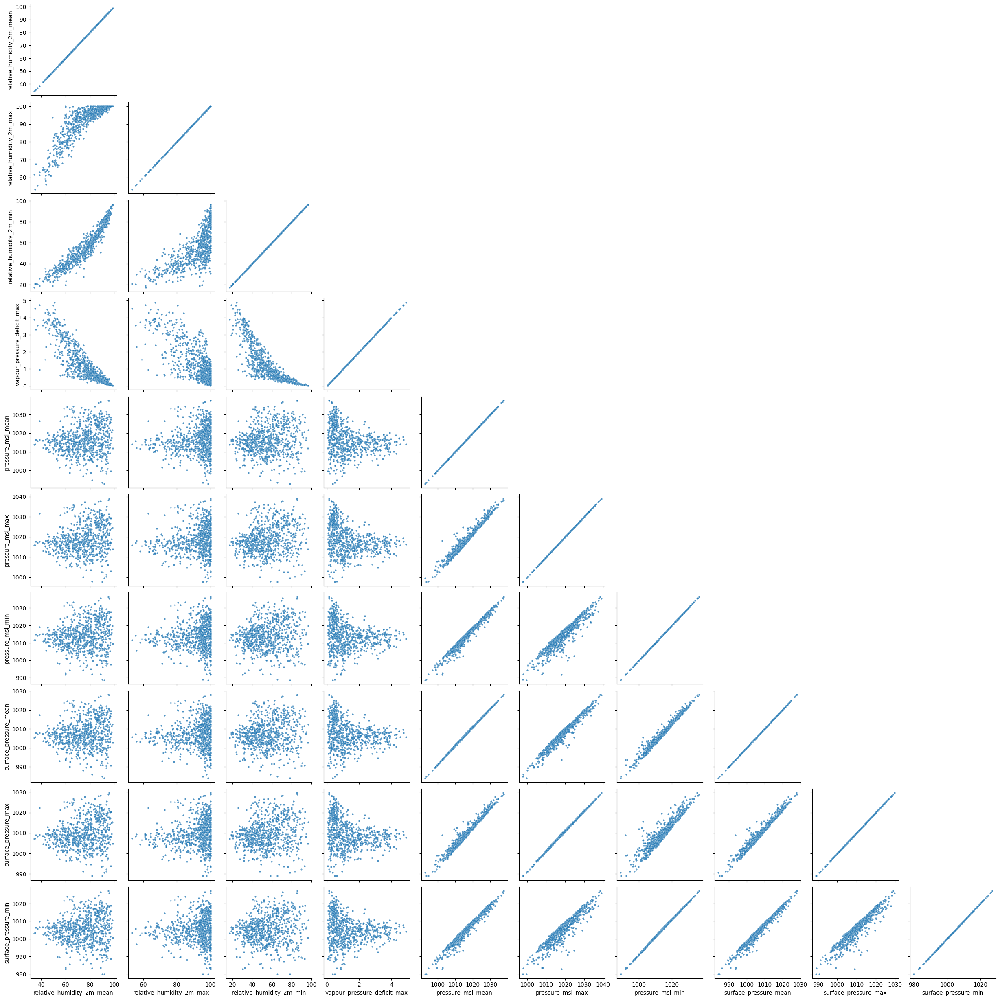

In [32]:

sns.pairplot(
    df_finale[list_pressure],
    diag_kind=None,
    corner=True,
    plot_kws={'s': 10, 'alpha': 0.4}
)

### Confronto con PM10

### Correlazione di Pearson confronto PM10

In [33]:
df_corr_p = (
    df_finale[list_pressure]
    .corrwith(df_finale["target_pm10"])
    .abs()
    .sort_values(ascending=False)
    .reset_index()
)

df_corr_p.columns = ["varA", "correlation"]
df_corr_p["varB"] = "target_pm10"

df_corr_p

,varA,correlation,varB
0,relative_humidity_2m_min,0.224716,target_pm10
1,relative_humidity_2m_mean,0.218918,target_pm10
2,vapour_pressure_deficit_max,0.177196,target_pm10
3,relative_humidity_2m_max,0.148967,target_pm10
4,pressure_msl_max,0.139741,target_pm10
5,surface_pressure_max,0.135174,target_pm10
6,pressure_msl_mean,0.127447,target_pm10
7,surface_pressure_mean,0.122421,target_pm10
8,pressure_msl_min,0.113510,target_pm10
9,surface_pressure_min,0.107638,target_pm10


### Correlazione di Spearman confronto PM10

In [34]:
df_corr_s = (
    df_finale[list_pressure]
    .corrwith(df_finale["target_pm10"], method='spearman')
    .abs()
    .sort_values(ascending=False)
    .reset_index()
)

df_corr_s.columns = ["varA", "correlation"]
df_corr_s["varB"] = "target_pm10"

df_corr_s

,varA,correlation,varB
0,relative_humidity_2m_mean,0.231820,target_pm10
1,vapour_pressure_deficit_max,0.224624,target_pm10
2,relative_humidity_2m_min,0.218451,target_pm10
3,relative_humidity_2m_max,0.202515,target_pm10
4,pressure_msl_max,0.130718,target_pm10
5,surface_pressure_max,0.126958,target_pm10
6,pressure_msl_mean,0.119470,target_pm10
7,surface_pressure_mean,0.115477,target_pm10
8,pressure_msl_min,0.107387,target_pm10
9,surface_pressure_min,0.102403,target_pm10


### v-score confronto PM10

In [35]:
df_vscore = df_finale.copy()

for k in list_pressure :   # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                                # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].dropna().unique()))})   # ... resetting labels

In [36]:
list_vscores = []

list_vars_vscore = list_pressure
list_vars_vscore = list(df_vscore[list_vars_vscore].nunique().sort_values(ascending=False).index)

for ii, i in enumerate(list_vars_vscore) :

    df_contingency = df_vscore.groupby([i,'target_pm10']).agg({'giorno':'count'})
    df_contingency = df_contingency.unstack().replace(0, np.nan)
    df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
    df_contingency = df_contingency.fillna(0).astype(int)

    r, c = df_contingency.shape
    n = df_contingency.sum().sum()

    vscore = scp_cont.association(df_contingency.values, method="tschuprow")
    vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
    vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
    vscore = np.sqrt(vscore)

    list_vscores.append([i,'target_pm10',vscore])

df_couples = pd.DataFrame(list_vscores, columns=['var-x', 'var-y', 'v-score'])
df_couples = df_couples.sort_values('v-score', ascending=False)

In [37]:
df_couples.head(12).style.background_gradient(vmin=0, vmax=.3).format(precision=2)

,var-x,var-y,v-score
0,relative_humidity_2m_mean,target_pm10,0.27
3,vapour_pressure_deficit_max,target_pm10,0.25
1,relative_humidity_2m_min,target_pm10,0.25
9,relative_humidity_2m_max,target_pm10,0.23
6,surface_pressure_max,target_pm10,0.21
5,pressure_msl_max,target_pm10,0.21
4,pressure_msl_mean,target_pm10,0.20
8,surface_pressure_min,target_pm10,0.19
7,surface_pressure_mean,target_pm10,0.19
2,pressure_msl_min,target_pm10,0.19


In [38]:
df_vscore = df_finale.copy()

for k in list_pressure :                # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                                  # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].dropna().unique()))})     # ... resetting labels

In [39]:
for ii, i in enumerate(list_vars_vscore[:-1]) :
    for jj, j in enumerate(list_vars_vscore[ii+1:]) :

        df_contingency = df_vscore.groupby([i,j,'target_pm10']).agg({'giorno':'count'})
        df_contingency = df_contingency.unstack().replace(0, np.nan)
        df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
        df_contingency = df_contingency.fillna(0).astype(int)

        r, c = df_contingency.shape
        n = df_contingency.sum().sum()

        vscore = scp_cont.association(df_contingency.values, method="tschuprow")
        vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
        vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
        vscore = np.sqrt(vscore)

        list_vscores.append([i,j,'target_pm10',vscore])

df_triplets = pd.DataFrame(list_vscores, columns=['var-x0', 'var-x1', 'var-y', 'v-score'])
df_triplets = df_triplets.sort_values('v-score', ascending=False)

In [40]:
df_triplets.head(10).style.background_gradient(vmin=0, vmax=.5).format(precision=2)

,var-x0,var-x1,var-y,v-score
13,relative_humidity_2m_mean,pressure_msl_mean,target_pm10,0.52
16,relative_humidity_2m_mean,surface_pressure_mean,target_pm10,0.52
48,pressure_msl_max,relative_humidity_2m_max,target_pm10,0.52
15,relative_humidity_2m_mean,surface_pressure_max,target_pm10,0.52
22,relative_humidity_2m_min,pressure_msl_max,target_pm10,0.51
27,pressure_msl_min,vapour_pressure_deficit_max,target_pm10,0.51
54,surface_pressure_min,relative_humidity_2m_max,target_pm10,0.51
53,surface_pressure_mean,relative_humidity_2m_max,target_pm10,0.51
23,relative_humidity_2m_min,surface_pressure_max,target_pm10,0.51
19,relative_humidity_2m_min,pressure_msl_min,target_pm10,0.50


### Scatter Plot confronto PM10

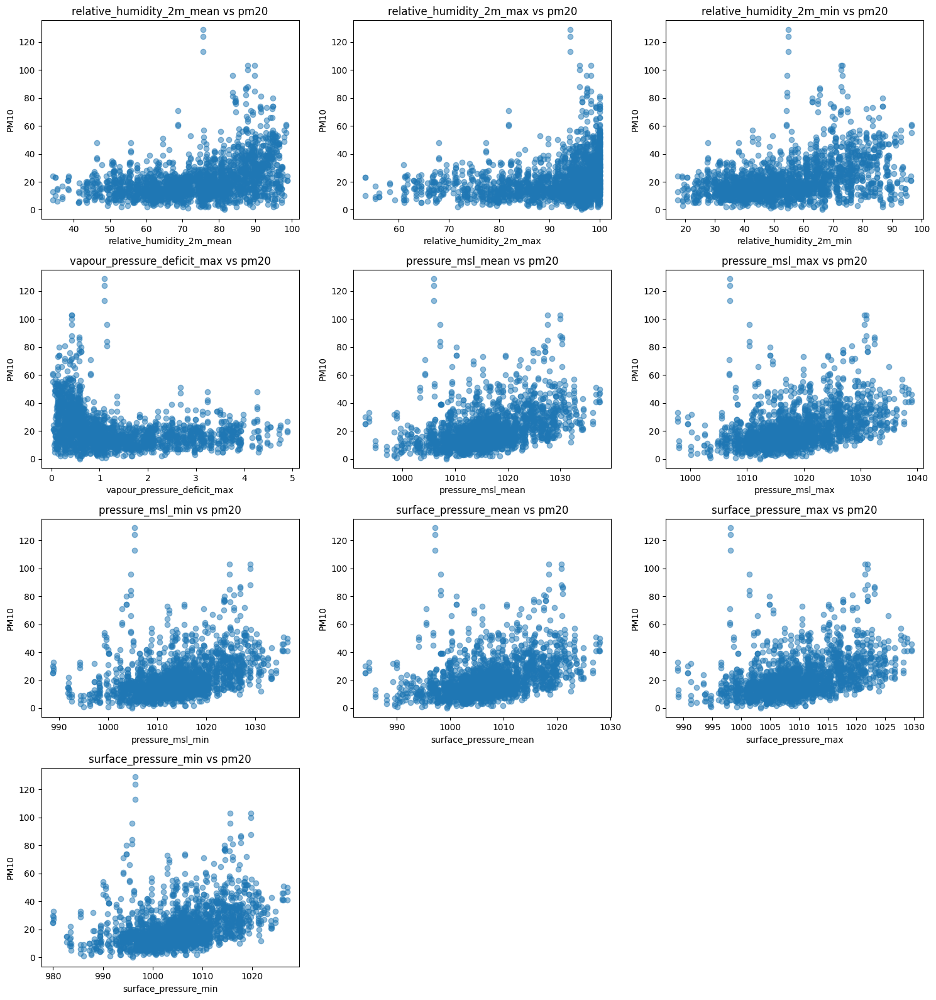

In [41]:
n = len(list_pressure)
cols = 3
rows = math.ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 4))
axes = axes.flatten()

for i, col in enumerate(list_pressure):
    axes[i].scatter(df_finale[col], df_finale['PM10'], alpha=0.5)
    axes[i].set_title(f'{col} vs pm20')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('PM10')

# elimina assi vuoti
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

### Information Value confronto PM10

L'IV serve per la feature selection.
Compara la distribuzione delle variabili per la target con la distribuzione per la non target.

Ha un vaore che va da zero a infinito -> valori alti = più forte capacità predittiva

Formula:
IV = ∑ (Good Distribution — Bad Distribution) * Weight of Evidence

+ Good distribution: % nella distribuzione per cui la target è 0 dato un valore della feature
+ Bad distribution: % nella distribuzione per cui la target è 1 dato un valore della feature
+ Weight of Evidence = ln(Good Distribution/Bad Distribution) -> se è positivo ci sono più zeri che 1, se è negativo è il contrario

WOE - Come calcolarla:
Dividi in bins le variabili numeriche
Calcola il numero di eventi e non-eventi in ogni gruppo (eventi: pm10 > 50)
Calcola le % di eventi e non eventi in ogni gruppo
Calcola il WOE dividendo % di non-event a quella di eventi

IV
Less than 0.02	Not useful for prediction
0.02 to 0.1	Weak predictive Power
0.1 to 0.3	Medium predictive Power
0.3 to 0.5	Strong predictive Power
oltre 0.5	Suspicious Predictive Power


In [42]:
#!pip install scorecardpy
'''
!pip uninstall setuptools -y
!pip install setuptools==69.5.1'''

'\n!pip uninstall setuptools -y\n!pip install setuptools==69.5.1'

In [43]:
features = list_pressure
target = 'target_pm10'  # 1 = sopra soglia, 0 = sotto

# prendi solo le colonne che ti servono
df_sub = df_finale[features + [target]]

# calcolo IV solo su queste
iv_df = sc.iv(df_sub, y=target)

In [44]:
iv_df.head(20).style.background_gradient(vmin=0, vmax=.5).format(precision=2)

,variable,info_value
3,pressure_msl_max,0.77
2,pressure_msl_min,0.67
7,pressure_msl_mean,0.24
1,relative_humidity_2m_min,0.23
6,vapour_pressure_deficit_max,0.23
4,surface_pressure_max,0.23
5,surface_pressure_mean,0.22
0,relative_humidity_2m_mean,0.22
8,surface_pressure_min,0.22
9,relative_humidity_2m_max,0.17


### Confronto e scelta

confronto le correlazioni, le associazioni e la capacità predittiva rispetto al PM10

In [45]:
display(
    iv_df.head(20).style.background_gradient(vmin=0, vmax=.5).format(precision=2),
    df_couples.head(20).style.background_gradient(vmin=0, vmax=.3).format(precision=2),
    df_corr_p.head(20).style.background_gradient(vmin=0, vmax=.3).format(precision=2),
    df_corr_s.head(20).style.background_gradient(vmin=0, vmax=.3).format(precision=2)

)

,variable,info_value
3,pressure_msl_max,0.77
2,pressure_msl_min,0.67
7,pressure_msl_mean,0.24
1,relative_humidity_2m_min,0.23
6,vapour_pressure_deficit_max,0.23
4,surface_pressure_max,0.23
5,surface_pressure_mean,0.22
0,relative_humidity_2m_mean,0.22
8,surface_pressure_min,0.22
9,relative_humidity_2m_max,0.17


,var-x,var-y,v-score
0,relative_humidity_2m_mean,target_pm10,0.27
3,vapour_pressure_deficit_max,target_pm10,0.25
1,relative_humidity_2m_min,target_pm10,0.25
9,relative_humidity_2m_max,target_pm10,0.23
6,surface_pressure_max,target_pm10,0.21
5,pressure_msl_max,target_pm10,0.21
4,pressure_msl_mean,target_pm10,0.20
8,surface_pressure_min,target_pm10,0.19
7,surface_pressure_mean,target_pm10,0.19
2,pressure_msl_min,target_pm10,0.19


,varA,correlation,varB
0,relative_humidity_2m_min,0.22,target_pm10
1,relative_humidity_2m_mean,0.22,target_pm10
2,vapour_pressure_deficit_max,0.18,target_pm10
3,relative_humidity_2m_max,0.15,target_pm10
4,pressure_msl_max,0.14,target_pm10
5,surface_pressure_max,0.14,target_pm10
6,pressure_msl_mean,0.13,target_pm10
7,surface_pressure_mean,0.12,target_pm10
8,pressure_msl_min,0.11,target_pm10
9,surface_pressure_min,0.11,target_pm10


,varA,correlation,varB
0,relative_humidity_2m_mean,0.23,target_pm10
1,vapour_pressure_deficit_max,0.22,target_pm10
2,relative_humidity_2m_min,0.22,target_pm10
3,relative_humidity_2m_max,0.20,target_pm10
4,pressure_msl_max,0.13,target_pm10
5,surface_pressure_max,0.13,target_pm10
6,pressure_msl_mean,0.12,target_pm10
7,surface_pressure_mean,0.12,target_pm10
8,pressure_msl_min,0.11,target_pm10
9,surface_pressure_min,0.10,target_pm10


A questo punto se guardiamo sia le tabelle delv-score che dell'IV i valori non sono tutti coerenti, ma vediamo che i v-score e le correlazioni hanno valori medi e non tanto distanti, mentre gli IV sono più differenziati.
Inoltre il v-score e la correlazione sono più orientati a studiare l'associazione tra variabili, mentre l'IV è un indice più centrato nel nostro caso perchè cacola la capacità predittiva. Visto che noi dobbiamo fare un modello è meglio l'IV.

Dall'osservazione delle correlazioni scegliamo di prendere una variabile tra pressure_msl e surface_pressure perchè sono in generale molto correlate e una tra relative humidity e vapour presure defcit perchè anche queste sono correlate.

Guardando l'IV prendiamo pressure_msl_max e relative_humidity_2m_min che ha valori medi in tutti gli indici.


In [46]:
list_pressure_update = ['pressure_msl_max','relative_humidity_2m_min']

Ragione anche di scelta di senso: tra pressure_msl e surface_pressure non c'è differenza se non che msl è standardizzato quindi ha senso sceglierne solo una. Quando la pressione è alta l'aria scende verso il basso e gli inquinanti tendono a rimanere intrappolati. Il fatto che il massimo sia un valore che meglio predice la target è coerente con il significato della nostra target: valori che vanno oltre la soglia.

Per quanto riguarda l'umidità può essere difficile relazionarla al PM10 perchè varia. Ma prendiamo il minimo anche perchè quando è bassa sicuramente il PM10 aumenta: l'aria è secca e il PM10 tende a restare in sospeso. Con umidità bassa: il suolo è più secco, la polvere è più “libera” e basta poco vento o traffico per sollevare polveri da strada, campi, superfici.
Il vapour pressure deficit è una proxy dell'umidità.

## Temperature

In [47]:
list_temperature = [
        'temperature_2m_mean', 'temperature_2m_max', 'temperature_2m_min',
        'apparent_temperature_mean', 'apparent_temperature_max', 'apparent_temperature_min',
        'wet_bulb_temperature_2m_mean', 'wet_bulb_temperature_2m_max', 'wet_bulb_temperature_2m_min',
        'dew_point_2m_mean', 'dew_point_2m_max', 'dew_point_2m_min']

### Correlazione di Pearson

In [48]:
# correlazione tra le variabili

corr_matrix = df_finale[list_temperature].corr(numeric_only=True, method='pearson')

list_corr = []
cols = corr_matrix.columns.tolist()

for ii, i in enumerate(cols[:-1]):
    for jj, j in enumerate(cols[ii+1:]):
        list_corr.append([i, j, corr_matrix.loc[i, j]])

df_corr = pd.DataFrame(list_corr, columns=['varA', 'varB', 'correlation'])
df_corr = df_corr.sort_values('correlation', ascending=False, key=abs)

df_corr.loc[df_corr['correlation'] > 0.98,:]

,varA,varB,correlation
2,temperature_2m_mean,apparent_temperature_mean,0.996132
23,temperature_2m_min,apparent_temperature_min,0.994413
13,temperature_2m_max,apparent_temperature_max,0.994272
47,apparent_temperature_min,wet_bulb_temperature_2m_min,0.991120
51,wet_bulb_temperature_2m_mean,wet_bulb_temperature_2m_max,0.989237
52,wet_bulb_temperature_2m_mean,wet_bulb_temperature_2m_min,0.988547
32,apparent_temperature_mean,wet_bulb_temperature_2m_mean,0.988383
30,apparent_temperature_mean,apparent_temperature_max,0.988339
3,temperature_2m_mean,apparent_temperature_max,0.988196
0,temperature_2m_mean,temperature_2m_max,0.987730


### Correlazione di Spearman

In [49]:
corr_matrix = df_finale[list_temperature].corr(numeric_only=True, method='spearman')

list_corr = []
cols = corr_matrix.columns.tolist()

for ii, i in enumerate(cols[:-1]):
    for jj, j in enumerate(cols[ii+1:]):
        list_corr.append([i, j, corr_matrix.loc[i, j]])

df_corr = pd.DataFrame(list_corr, columns=['varA', 'varB', 'correlation'])
df_corr = df_corr.sort_values('correlation', ascending=False, key=abs)

df_corr.loc[df_corr['correlation'] > 0.98,:]

,varA,varB,correlation
2,temperature_2m_mean,apparent_temperature_mean,0.996333
23,temperature_2m_min,apparent_temperature_min,0.995029
13,temperature_2m_max,apparent_temperature_max,0.994637
47,apparent_temperature_min,wet_bulb_temperature_2m_min,0.993742
32,apparent_temperature_mean,wet_bulb_temperature_2m_mean,0.992911
45,apparent_temperature_min,wet_bulb_temperature_2m_mean,0.990428
51,wet_bulb_temperature_2m_mean,wet_bulb_temperature_2m_max,0.989845
52,wet_bulb_temperature_2m_mean,wet_bulb_temperature_2m_min,0.988222
33,apparent_temperature_mean,wet_bulb_temperature_2m_max,0.988167
3,temperature_2m_mean,apparent_temperature_max,0.987395


### v-score

In [50]:
df_vscore = df_finale.copy()

for k in list_temperature :   # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                     # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].unique()))}) # ... resetting labels

In [51]:
list_vscores = []

list_vars_vscore = list_temperature
list_vars_vscore = list(df_vscore[list_vars_vscore].nunique().sort_values(ascending=False).index)

for ii, i in enumerate(list_vars_vscore[:-1]) :
    for jj, j in enumerate(list_vars_vscore[ii+1:]) :

        df_contingency = df_vscore.groupby([i,j]).agg({'giorno':'count'})
        df_contingency = df_contingency.unstack().replace(0, np.nan)
        df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
        df_contingency = df_contingency.fillna(0).astype(int)

        r, c = df_contingency.shape
        n = df_contingency.sum().sum()

        vscore = scp_cont.association(df_contingency.values, method="tschuprow")
        vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
        vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
        vscore = np.sqrt(vscore)

        list_vscores.append([i,j,vscore])

df_vscore = pd.DataFrame(list_vscores, columns=['varA', 'varB', 'v-score'])
df_vscore = df_vscore.sort_values('v-score', ascending=False)

In [52]:
df_vscore.head(50).style.background_gradient(vmin=0, vmax=1).format(precision=2)

,varA,varB,v-score
2,temperature_2m_mean,apparent_temperature_mean,0.70
23,temperature_2m_min,apparent_temperature_min,0.66
47,apparent_temperature_min,wet_bulb_temperature_2m_min,0.63
13,temperature_2m_max,apparent_temperature_max,0.63
32,apparent_temperature_mean,wet_bulb_temperature_2m_mean,0.59
51,wet_bulb_temperature_2m_mean,wet_bulb_temperature_2m_max,0.56
26,temperature_2m_min,wet_bulb_temperature_2m_min,0.56
0,temperature_2m_mean,temperature_2m_max,0.55
30,apparent_temperature_mean,apparent_temperature_max,0.55
45,apparent_temperature_min,wet_bulb_temperature_2m_mean,0.55


In [53]:
# ora guardo il vscore a tre
df_vscore = df_finale.copy()

for k in list_temperature :   # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                     # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].unique()))}) # ... resetting labels

In [54]:
list_vscores = []

list_vars_vscore = list_temperature
list_vars_vscore = list(df_vscore[list_vars_vscore].nunique().sort_values(ascending=False).index)

for ii, i in enumerate(list_vars_vscore[:-2]) :
    for jj, j in enumerate(list_vars_vscore[ii+1:-1]) :
        for kk, k in enumerate(list_vars_vscore[ii+jj+2:]) :

            df_contingency = df_vscore.groupby([i,j,k]).agg({'giorno':'count'})
            df_contingency = df_contingency.unstack().replace(0, np.nan)
            df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
            df_contingency = df_contingency.fillna(0).astype(int)

            r, c = df_contingency.shape
            n = df_contingency.sum().sum()

            #vscore = scp_cont.association(df_contingency.values, method="cramer") # no - sovrastima le numeriche
            vscore = scp_cont.association(df_contingency.values, method="tschuprow")
            vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
            vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
            vscore = np.sqrt(vscore)

            list_vscores.append([i,j,k,vscore])

df_vscore = pd.DataFrame(list_vscores, columns=['varA0', 'varA1', 'varB', 'v-score'])
df_vscore = df_vscore.sort_values('v-score', ascending=False)

In [55]:
df_vscore.head(20).style.background_gradient(vmin=.9, vmax=1).format(precision=2)

,varA0,varA1,varB,v-score
10,temperature_2m_mean,temperature_2m_min,apparent_temperature_mean,0.75
57,temperature_2m_max,temperature_2m_min,apparent_temperature_min,0.74
64,temperature_2m_max,apparent_temperature_mean,apparent_temperature_max,0.74
1,temperature_2m_mean,temperature_2m_max,apparent_temperature_mean,0.73
108,temperature_2m_min,apparent_temperature_max,apparent_temperature_min,0.73
56,temperature_2m_max,temperature_2m_min,apparent_temperature_max,0.72
55,temperature_2m_max,temperature_2m_min,apparent_temperature_mean,0.72
101,temperature_2m_min,apparent_temperature_mean,apparent_temperature_min,0.71
12,temperature_2m_mean,temperature_2m_min,apparent_temperature_min,0.71
81,temperature_2m_max,apparent_temperature_min,wet_bulb_temperature_2m_min,0.70


### Scatter Plot

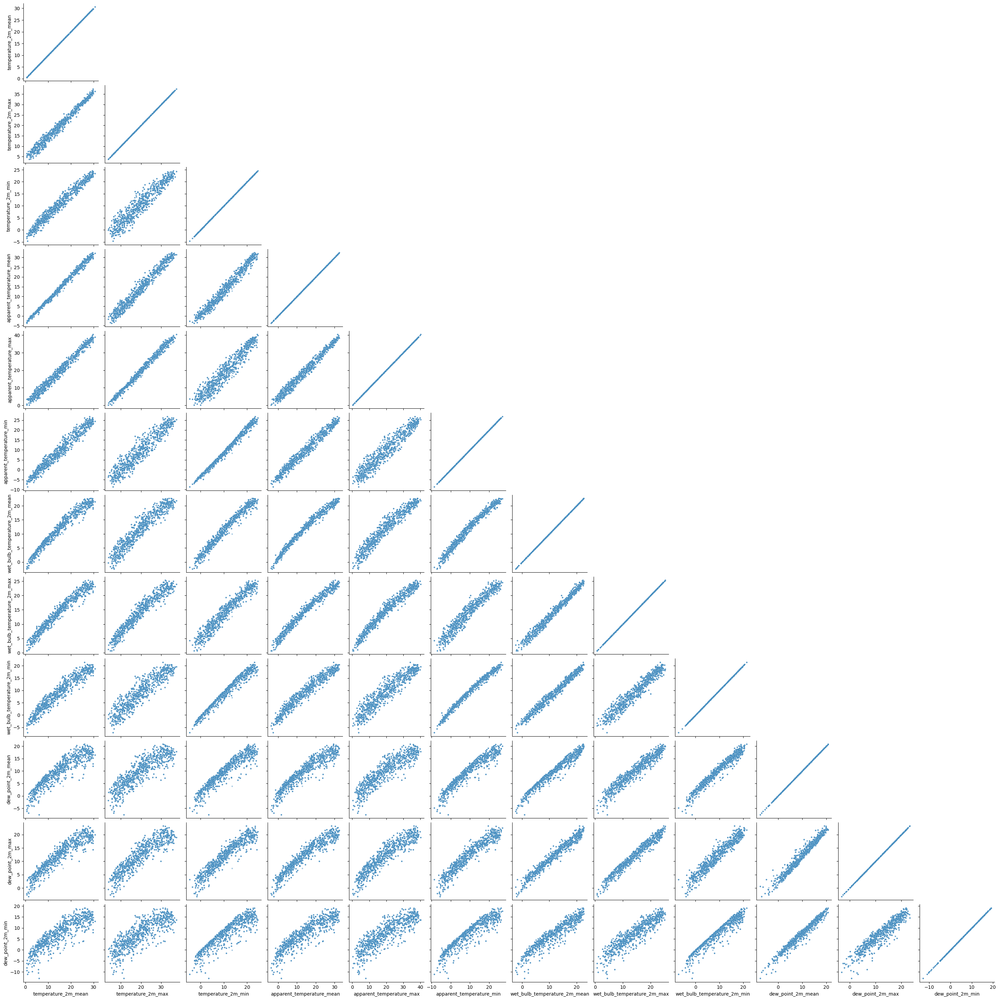

In [56]:
sns.pairplot(
    df_finale[list_temperature],
    diag_kind=None,
    corner=True,
    plot_kws={'s': 10, 'alpha': 0.4}
)

### Confronto con PM10

### Correlazione di Pearson confronto PM10

In [57]:
df_corr_p = (
    df_finale[list_temperature]
    .corrwith(df_finale["target_pm10"])
    .abs()
    .sort_values(ascending=False)
    .reset_index()
)

df_corr_p.columns = ["varA", "correlation"]
df_corr_p["varB"] = "target_pm10"

df_corr_p

,varA,correlation,varB
0,temperature_2m_max,0.192570,target_pm10
1,temperature_2m_mean,0.191768,target_pm10
2,temperature_2m_min,0.185705,target_pm10
3,apparent_temperature_max,0.182195,target_pm10
4,apparent_temperature_mean,0.180357,target_pm10
5,apparent_temperature_min,0.172731,target_pm10
6,wet_bulb_temperature_2m_mean,0.172721,target_pm10
7,wet_bulb_temperature_2m_max,0.171492,target_pm10
8,wet_bulb_temperature_2m_min,0.168815,target_pm10
9,dew_point_2m_max,0.152834,target_pm10


### Correlazione di Spearman confronto PM10

In [58]:
df_corr_s = (
    df_finale[list_temperature]
    .corrwith(df_finale["target_pm10"], method='spearman')
    .abs()
    .sort_values(ascending=False)
    .reset_index()
)

df_corr_s.columns = ["varA", "correlation"]
df_corr_s["varB"] = "target_pm10"

df_corr_s

,varA,correlation,varB
0,temperature_2m_max,0.196420,target_pm10
1,temperature_2m_mean,0.196198,target_pm10
2,temperature_2m_min,0.190544,target_pm10
3,apparent_temperature_max,0.185499,target_pm10
4,apparent_temperature_mean,0.184083,target_pm10
5,apparent_temperature_min,0.178080,target_pm10
6,wet_bulb_temperature_2m_mean,0.176649,target_pm10
7,wet_bulb_temperature_2m_min,0.174680,target_pm10
8,wet_bulb_temperature_2m_max,0.173830,target_pm10
9,dew_point_2m_max,0.162198,target_pm10


### v-score confronto PM10

In [59]:
df_vscore = df_finale.copy()

for k in list_temperature :   # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                                # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].dropna().unique()))})   # ... resetting labels

In [60]:
list_vscores = []

list_vars_vscore = list_temperature
list_vars_vscore = list(df_vscore[list_vars_vscore].nunique().sort_values(ascending=False).index)

for ii, i in enumerate(list_vars_vscore) :

    df_contingency = df_vscore.groupby([i,'target_pm10']).agg({'giorno':'count'})
    df_contingency = df_contingency.unstack().replace(0, np.nan)
    df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
    df_contingency = df_contingency.fillna(0).astype(int)

    r, c = df_contingency.shape
    n = df_contingency.sum().sum()

    vscore = scp_cont.association(df_contingency.values, method="tschuprow")
    vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
    vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
    vscore = np.sqrt(vscore)

    list_vscores.append([i,'target_pm10',vscore])

df_couples = pd.DataFrame(list_vscores, columns=['var-x', 'var-y', 'v-score'])
df_couples = df_couples.sort_values('v-score', ascending=False)

In [61]:
df_couples.head(12).style.background_gradient(vmin=0, vmax=.3).format(precision=2)

,var-x,var-y,v-score
1,temperature_2m_max,target_pm10,0.23
10,dew_point_2m_max,target_pm10,0.22
7,wet_bulb_temperature_2m_max,target_pm10,0.21
2,temperature_2m_min,target_pm10,0.21
8,wet_bulb_temperature_2m_min,target_pm10,0.21
5,apparent_temperature_min,target_pm10,0.21
4,apparent_temperature_max,target_pm10,0.20
0,temperature_2m_mean,target_pm10,0.20
6,wet_bulb_temperature_2m_mean,target_pm10,0.20
3,apparent_temperature_mean,target_pm10,0.19


In [62]:
df_vscore = df_finale.copy()

for k in list_temperature :                # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                                  # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].dropna().unique()))})     # ... resetting labels

In [63]:
for ii, i in enumerate(list_vars_vscore[:-1]) :
    for jj, j in enumerate(list_vars_vscore[ii+1:]) :

        df_contingency = df_vscore.groupby([i,j,'target_pm10']).agg({'giorno':'count'})
        df_contingency = df_contingency.unstack().replace(0, np.nan)
        df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
        df_contingency = df_contingency.fillna(0).astype(int)

        r, c = df_contingency.shape
        n = df_contingency.sum().sum()

        vscore = scp_cont.association(df_contingency.values, method="tschuprow")
        vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
        vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
        vscore = np.sqrt(vscore)

        list_vscores.append([i,j,'target_pm10',vscore])

df_triplets = pd.DataFrame(list_vscores, columns=['var-x0', 'var-x1', 'var-y', 'v-score'])
df_triplets = df_triplets.sort_values('v-score', ascending=False)

In [64]:
df_triplets.head(10).style.background_gradient(vmin=0, vmax=.5).format(precision=2)

,var-x0,var-x1,var-y,v-score
32,temperature_2m_max,dew_point_2m_min,target_pm10,0.43
25,temperature_2m_max,apparent_temperature_max,target_pm10,0.42
26,temperature_2m_max,apparent_temperature_min,target_pm10,0.40
56,apparent_temperature_max,dew_point_2m_min,target_pm10,0.38
29,temperature_2m_max,wet_bulb_temperature_2m_min,target_pm10,0.38
40,temperature_2m_min,dew_point_2m_max,target_pm10,0.37
77,dew_point_2m_max,dew_point_2m_min,target_pm10,0.37
12,temperature_2m_mean,temperature_2m_max,target_pm10,0.37
23,temperature_2m_max,temperature_2m_min,target_pm10,0.36
27,temperature_2m_max,wet_bulb_temperature_2m_mean,target_pm10,0.36


### Scatter Plot confronto PM10

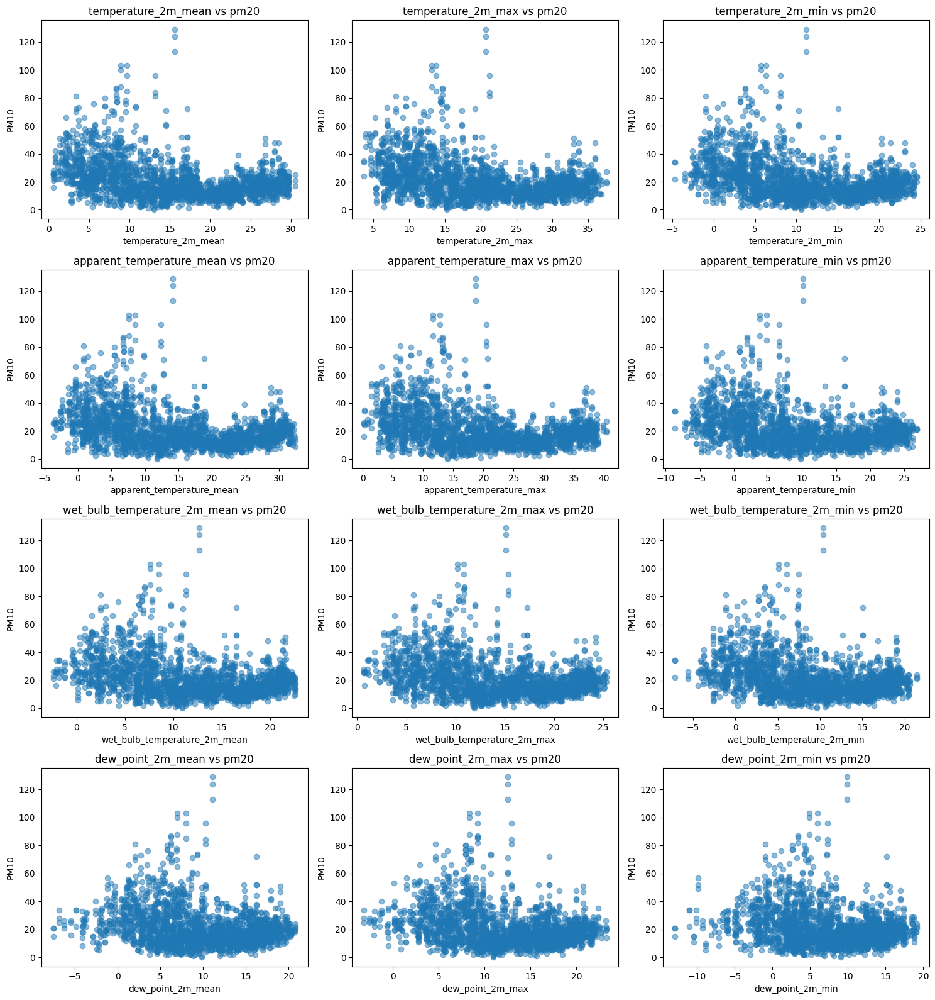

In [65]:
n = len(list_temperature)
cols = 3
rows = math.ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 4))
axes = axes.flatten()

for i, col in enumerate(list_temperature):
    axes[i].scatter(df_finale[col], df_finale['PM10'], alpha=0.5)
    axes[i].set_title(f'{col} vs pm20')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('PM10')

# elimina assi vuoti
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

### Information Value confronto PM10

L'IV serve per la feature selection.
Compara la distribuzione delle variabili per la target con la distribuzione per la non target.

Ha un vaore che va da zero a infinito -> valori alti = più forte capacità predittiva

Formula:
IV = ∑ (Good Distribution — Bad Distribution) * Weight of Evidence

+ Good distribution: % nella distribuzione per cui la target è 0 dato un valore della feature
+ Bad distribution: % nella distribuzione per cui la target è 1 dato un valore della feature
+ Weight of Evidence = ln(Good Distribution/Bad Distribution) -> se è positivo ci sono più zeri che 1, se è negativo è il contrario

WOE - Come calcolarla:
Dividi in bins le variabili numeriche
Calcola il numero di eventi e non-eventi in ogni gruppo (eventi: pm10 > 50)
Calcola le % di eventi e non eventi in ogni gruppo
Calcola il WOE dividendo % di non-event a quella di eventi

IV
Less than 0.02	Not useful for prediction
0.02 to 0.1	Weak predictive Power
0.1 to 0.3	Medium predictive Power
0.3 to 0.5	Strong predictive Power
oltre 0.5	Suspicious Predictive Power


In [66]:
features = list_temperature
target = 'target_pm10'  # 1 = sopra soglia, 0 = sotto

# prendi solo le colonne che ti servono
df_sub = df_finale[features + [target]]

# calcolo IV solo su queste
iv_df = sc.iv(df_sub, y=target)

In [67]:
iv_df.head(20).style.background_gradient(vmin=0, vmax=.5).format(precision=2)

,variable,info_value
4,dew_point_2m_max,0.55
2,dew_point_2m_min,0.55
3,temperature_2m_min,0.49
9,temperature_2m_max,0.47
5,temperature_2m_mean,0.24
1,wet_bulb_temperature_2m_min,0.23
8,dew_point_2m_mean,0.23
0,apparent_temperature_min,0.22
10,apparent_temperature_mean,0.22
7,wet_bulb_temperature_2m_max,0.22


### Confronto e scelta

confronto le correlazioni, le associazioni e la capacità predittiva rispetto al PM10

In [68]:
display(
    iv_df.head(20).style.background_gradient(vmin=0, vmax=.5).format(precision=2),
    df_couples.head(20).style.background_gradient(vmin=0, vmax=.3).format(precision=2),
    df_corr_p.head(20).style.background_gradient(vmin=0, vmax=.3).format(precision=2),
    df_corr_s.head(20).style.background_gradient(vmin=0, vmax=.3).format(precision=2)

)

,variable,info_value
4,dew_point_2m_max,0.55
2,dew_point_2m_min,0.55
3,temperature_2m_min,0.49
9,temperature_2m_max,0.47
5,temperature_2m_mean,0.24
1,wet_bulb_temperature_2m_min,0.23
8,dew_point_2m_mean,0.23
0,apparent_temperature_min,0.22
10,apparent_temperature_mean,0.22
7,wet_bulb_temperature_2m_max,0.22


,var-x,var-y,v-score
1,temperature_2m_max,target_pm10,0.23
10,dew_point_2m_max,target_pm10,0.22
7,wet_bulb_temperature_2m_max,target_pm10,0.21
2,temperature_2m_min,target_pm10,0.21
8,wet_bulb_temperature_2m_min,target_pm10,0.21
5,apparent_temperature_min,target_pm10,0.21
4,apparent_temperature_max,target_pm10,0.20
0,temperature_2m_mean,target_pm10,0.20
6,wet_bulb_temperature_2m_mean,target_pm10,0.20
3,apparent_temperature_mean,target_pm10,0.19


,varA,correlation,varB
0,temperature_2m_max,0.19,target_pm10
1,temperature_2m_mean,0.19,target_pm10
2,temperature_2m_min,0.19,target_pm10
3,apparent_temperature_max,0.18,target_pm10
4,apparent_temperature_mean,0.18,target_pm10
5,apparent_temperature_min,0.17,target_pm10
6,wet_bulb_temperature_2m_mean,0.17,target_pm10
7,wet_bulb_temperature_2m_max,0.17,target_pm10
8,wet_bulb_temperature_2m_min,0.17,target_pm10
9,dew_point_2m_max,0.15,target_pm10


,varA,correlation,varB
0,temperature_2m_max,0.20,target_pm10
1,temperature_2m_mean,0.20,target_pm10
2,temperature_2m_min,0.19,target_pm10
3,apparent_temperature_max,0.19,target_pm10
4,apparent_temperature_mean,0.18,target_pm10
5,apparent_temperature_min,0.18,target_pm10
6,wet_bulb_temperature_2m_mean,0.18,target_pm10
7,wet_bulb_temperature_2m_min,0.17,target_pm10
8,wet_bulb_temperature_2m_max,0.17,target_pm10
9,dew_point_2m_max,0.16,target_pm10


Rispetto a Pressure vediamo che temperature non ha valori altissimi nelle correlazioni e anche nell'IV rispetto a PM10.
E soprattutto quando abbiamo confrontato le correlazioni tra le variabili abbiamo trovato correlazioni altissime. Quindi ne selezionerei solo una o max due di variabile di temperatura.

Guardando l'IV e le associazioni prendiamo dew_point_2m_max e temperature_2m_max.
Ricordiamoci però che sarebbe bene lasciarne anche solo uno dei due nel modello: sono davvero molto correlati.

In [69]:
list_temperature_update = ['dew_point_2m_max','temperature_2m_max']

Spiegazione logica: apparent_temperature la escludiamo a priori, serve per la percezione umana. La temperatura a 2 metri è molto utile, ci aspettiamo che il PM10 sia più alto con le basse temperature: ci sono più emissioni.
Wet bulb combina temperatura e umidità: come scritto sotto.
Dew point: temperatura alla quale l’aria diventa satura. è il concetto di umidità che abbiamo visto nella parte sulla pressione:  alto dew point → aria umida → particelle crescono. basso dew point → aria secca → polvere sospesa.

Dato che può essere interessante avere un valore di temperatura e un valore di umidità abbiamo scelto la temperatura massima e il dew point massimo. Anche perchè il wet_bulb risultava molto correlato e associato alla temperatura.

## Wind

In [70]:
list_wind = [
        'wind_speed_10m_mean', 'wind_speed_10m_max', 'wind_speed_10m_min',
        'wind_gusts_10m_mean', 'wind_gusts_10m_max', 'wind_gusts_10m_min',
        'wind_direction_10m_dominant']

In [71]:
list_wind

['wind_speed_10m_mean',
 'wind_speed_10m_max',
 'wind_speed_10m_min',
 'wind_gusts_10m_mean',
 'wind_gusts_10m_max',
 'wind_gusts_10m_min',
 'wind_direction_10m_dominant']

### Correlazione di Pearson

In [72]:
# correlazione tra le variabili

corr_matrix = df_finale[list_wind].corr(numeric_only=True, method='pearson')

list_corr = []
cols = corr_matrix.columns.tolist()

for ii, i in enumerate(cols[:-1]):
    for jj, j in enumerate(cols[ii+1:]):
        list_corr.append([i, j, corr_matrix.loc[i, j]])

df_corr = pd.DataFrame(list_corr, columns=['varA', 'varB', 'correlation'])
df_corr = df_corr.sort_values('correlation', ascending=False, key=abs)

df_corr.loc[df_corr['correlation'] > 0.78,:]

,varA,varB,correlation
2,wind_speed_10m_mean,wind_gusts_10m_mean,0.960464
8,wind_speed_10m_max,wind_gusts_10m_max,0.926180
15,wind_gusts_10m_mean,wind_gusts_10m_max,0.884239
0,wind_speed_10m_mean,wind_speed_10m_max,0.878485
7,wind_speed_10m_max,wind_gusts_10m_mean,0.876088
3,wind_speed_10m_mean,wind_gusts_10m_max,0.830728


Notiamo subito come le correlazioni siano piuttosto basse rispetto alle altre due variabili 

### Correlazione di Spearman

In [73]:
corr_matrix = df_finale[list_wind].corr(numeric_only=True, method='spearman')

list_corr = []
cols = corr_matrix.columns.tolist()

for ii, i in enumerate(cols[:-1]):
    for jj, j in enumerate(cols[ii+1:]):
        list_corr.append([i, j, corr_matrix.loc[i, j]])

df_corr = pd.DataFrame(list_corr, columns=['varA', 'varB', 'correlation'])
df_corr = df_corr.sort_values('correlation', ascending=False, key=abs)

df_corr.loc[df_corr['correlation'] > 0.78,:]

,varA,varB,correlation
2,wind_speed_10m_mean,wind_gusts_10m_mean,0.949469
8,wind_speed_10m_max,wind_gusts_10m_max,0.916505
15,wind_gusts_10m_mean,wind_gusts_10m_max,0.890513
0,wind_speed_10m_mean,wind_speed_10m_max,0.878124
7,wind_speed_10m_max,wind_gusts_10m_mean,0.871833
3,wind_speed_10m_mean,wind_gusts_10m_max,0.826207


### v-score

In [74]:
df_vscore = df_finale.copy()

for k in list_wind :   # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                     # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].unique()))}) # ... resetting labels

In [75]:
list_vscores = []

list_vars_vscore = list_wind
list_vars_vscore = list(df_vscore[list_vars_vscore].nunique().sort_values(ascending=False).index)

for ii, i in enumerate(list_vars_vscore[:-1]) :
    for jj, j in enumerate(list_vars_vscore[ii+1:]) :

        df_contingency = df_vscore.groupby([i,j]).agg({'giorno':'count'})
        df_contingency = df_contingency.unstack().replace(0, np.nan)
        df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
        df_contingency = df_contingency.fillna(0).astype(int)

        r, c = df_contingency.shape
        n = df_contingency.sum().sum()

        vscore = scp_cont.association(df_contingency.values, method="tschuprow")
        vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
        vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
        vscore = np.sqrt(vscore)

        list_vscores.append([i,j,vscore])

df_vscore = pd.DataFrame(list_vscores, columns=['varA', 'varB', 'v-score'])
df_vscore = df_vscore.sort_values('v-score', ascending=False)

In [76]:
df_vscore.head(50).style.background_gradient(vmin=0, vmax=1).format(precision=2)

,varA,varB,v-score
2,wind_speed_10m_mean,wind_gusts_10m_mean,0.43
8,wind_speed_10m_max,wind_gusts_10m_max,0.37
0,wind_speed_10m_mean,wind_speed_10m_max,0.34
15,wind_gusts_10m_mean,wind_gusts_10m_max,0.33
7,wind_speed_10m_max,wind_gusts_10m_mean,0.31
3,wind_speed_10m_mean,wind_gusts_10m_max,0.29
4,wind_speed_10m_mean,wind_gusts_10m_min,0.25
16,wind_gusts_10m_mean,wind_gusts_10m_min,0.25
13,wind_speed_10m_min,wind_gusts_10m_min,0.24
1,wind_speed_10m_mean,wind_speed_10m_min,0.22


In [77]:
# ora guardo il vscore a tre
df_vscore = df_finale.copy()

for k in list_wind :   # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                     # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].unique()))}) # ... resetting labels

In [78]:
list_vscores = []

list_vars_vscore = list_wind
list_vars_vscore = list(df_vscore[list_vars_vscore].nunique().sort_values(ascending=False).index)

for ii, i in enumerate(list_vars_vscore[:-2]) :
    for jj, j in enumerate(list_vars_vscore[ii+1:-1]) :
        for kk, k in enumerate(list_vars_vscore[ii+jj+2:]) :

            df_contingency = df_vscore.groupby([i,j,k]).agg({'giorno':'count'})
            df_contingency = df_contingency.unstack().replace(0, np.nan)
            df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
            df_contingency = df_contingency.fillna(0).astype(int)

            r, c = df_contingency.shape
            n = df_contingency.sum().sum()

            #vscore = scp_cont.association(df_contingency.values, method="cramer") # no - sovrastima le numeriche
            vscore = scp_cont.association(df_contingency.values, method="tschuprow")
            vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
            vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
            vscore = np.sqrt(vscore)

            list_vscores.append([i,j,k,vscore])

df_vscore = pd.DataFrame(list_vscores, columns=['varA0', 'varA1', 'varB', 'v-score'])
df_vscore = df_vscore.sort_values('v-score', ascending=False)

In [79]:
df_vscore.head(20).style.background_gradient(vmin=.9, vmax=1).format(precision=2)

,varA0,varA1,varB,v-score
16,wind_speed_10m_max,wind_speed_10m_min,wind_gusts_10m_max,0.67
5,wind_speed_10m_mean,wind_speed_10m_min,wind_gusts_10m_mean,0.67
15,wind_speed_10m_max,wind_speed_10m_min,wind_gusts_10m_mean,0.66
26,wind_speed_10m_min,wind_gusts_10m_mean,wind_gusts_10m_min,0.64
25,wind_speed_10m_min,wind_gusts_10m_mean,wind_gusts_10m_max,0.63
17,wind_speed_10m_max,wind_speed_10m_min,wind_gusts_10m_min,0.63
28,wind_speed_10m_min,wind_gusts_10m_max,wind_gusts_10m_min,0.63
7,wind_speed_10m_mean,wind_speed_10m_min,wind_gusts_10m_min,0.61
18,wind_speed_10m_max,wind_speed_10m_min,wind_direction_10m_dominant,0.61
6,wind_speed_10m_mean,wind_speed_10m_min,wind_gusts_10m_max,0.61


### Scatter Plot

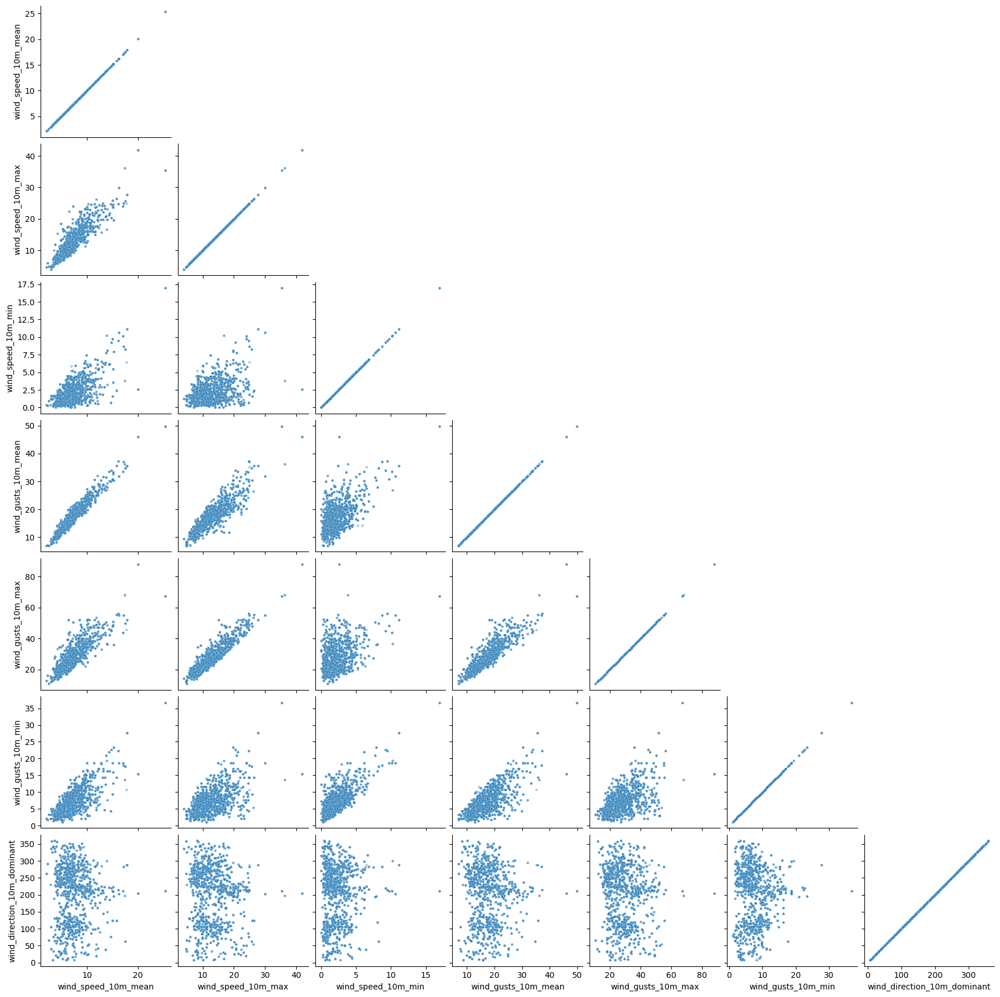

In [80]:
sns.pairplot(
    df_finale[list_wind],
    diag_kind=None,
    corner=True,
    plot_kws={'s': 10, 'alpha': 0.4}
)

### Confronto con PM10

### Correlazione di Pearson confronto PM10

In [81]:
df_corr_p = (
    df_finale[list_wind]
    .corrwith(df_finale["target_pm10"])
    .abs()
    .sort_values(ascending=False)
    .reset_index()
)

df_corr_p.columns = ["varA", "correlation"]
df_corr_p["varB"] = "target_pm10"

df_corr_p

,varA,correlation,varB
0,wind_gusts_10m_mean,0.213409,target_pm10
1,wind_speed_10m_mean,0.186976,target_pm10
2,wind_speed_10m_max,0.167242,target_pm10
3,wind_gusts_10m_max,0.163605,target_pm10
4,wind_gusts_10m_min,0.154907,target_pm10
5,wind_speed_10m_min,0.109153,target_pm10
6,wind_direction_10m_dominant,0.024723,target_pm10


### Correlazione di Spearman confronto PM10

In [82]:
df_corr_s = (
    df_finale[list_wind]
    .corrwith(df_finale["target_pm10"], method='spearman')
    .abs()
    .sort_values(ascending=False)
    .reset_index()
)

df_corr_s.columns = ["varA", "correlation"]
df_corr_s["varB"] = "target_pm10"

df_corr_s

,varA,correlation,varB
0,wind_gusts_10m_mean,0.245732,target_pm10
1,wind_speed_10m_mean,0.227240,target_pm10
2,wind_speed_10m_max,0.186339,target_pm10
3,wind_gusts_10m_max,0.186326,target_pm10
4,wind_gusts_10m_min,0.179020,target_pm10
5,wind_speed_10m_min,0.141178,target_pm10
6,wind_direction_10m_dominant,0.016503,target_pm10


### v-score confronto PM10

In [83]:
df_vscore = df_finale.copy()

for k in list_wind :   # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                                # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].dropna().unique()))})   # ... resetting labels

In [84]:
list_vscores = []

list_vars_vscore = list_wind
list_vars_vscore = list(df_vscore[list_vars_vscore].nunique().sort_values(ascending=False).index)

for ii, i in enumerate(list_vars_vscore) :

    df_contingency = df_vscore.groupby([i,'target_pm10']).agg({'giorno':'count'})
    df_contingency = df_contingency.unstack().replace(0, np.nan)
    df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
    df_contingency = df_contingency.fillna(0).astype(int)

    r, c = df_contingency.shape
    n = df_contingency.sum().sum()

    vscore = scp_cont.association(df_contingency.values, method="tschuprow")
    vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
    vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
    vscore = np.sqrt(vscore)

    list_vscores.append([i,'target_pm10',vscore])

df_couples = pd.DataFrame(list_vscores, columns=['var-x', 'var-y', 'v-score'])
df_couples = df_couples.sort_values('v-score', ascending=False)

In [85]:
df_couples.head(12).style.background_gradient(vmin=0, vmax=.3).format(precision=2)

,var-x,var-y,v-score
3,wind_gusts_10m_mean,target_pm10,0.37
0,wind_speed_10m_mean,target_pm10,0.32
1,wind_speed_10m_max,target_pm10,0.28
4,wind_gusts_10m_max,target_pm10,0.24
5,wind_gusts_10m_min,target_pm10,0.20
6,wind_direction_10m_dominant,target_pm10,0.17
2,wind_speed_10m_min,target_pm10,0.16


In [86]:
df_vscore = df_finale.copy()

for k in list_wind :                # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                                  # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].dropna().unique()))})     # ... resetting labels

In [87]:
for ii, i in enumerate(list_vars_vscore[:-1]) :
    for jj, j in enumerate(list_vars_vscore[ii+1:]) :

        df_contingency = df_vscore.groupby([i,j,'target_pm10']).agg({'giorno':'count'})
        df_contingency = df_contingency.unstack().replace(0, np.nan)
        df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
        df_contingency = df_contingency.fillna(0).astype(int)

        r, c = df_contingency.shape
        n = df_contingency.sum().sum()

        vscore = scp_cont.association(df_contingency.values, method="tschuprow")
        vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
        vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
        vscore = np.sqrt(vscore)

        list_vscores.append([i,j,'target_pm10',vscore])

df_triplets = pd.DataFrame(list_vscores, columns=['var-x0', 'var-x1', 'var-y', 'v-score'])
df_triplets = df_triplets.sort_values('v-score', ascending=False)

In [88]:
df_triplets.head(10).style.background_gradient(vmin=0, vmax=.5).format(precision=2)

,var-x0,var-x1,var-y,v-score
26,wind_gusts_10m_max,wind_direction_10m_dominant,target_pm10,0.59
12,wind_speed_10m_mean,wind_direction_10m_dominant,target_pm10,0.54
17,wind_speed_10m_max,wind_direction_10m_dominant,target_pm10,0.54
13,wind_speed_10m_max,wind_speed_10m_min,target_pm10,0.53
22,wind_gusts_10m_mean,wind_gusts_10m_max,target_pm10,0.52
27,wind_gusts_10m_min,wind_direction_10m_dominant,target_pm10,0.51
11,wind_speed_10m_mean,wind_gusts_10m_min,target_pm10,0.50
24,wind_gusts_10m_mean,wind_direction_10m_dominant,target_pm10,0.50
23,wind_gusts_10m_mean,wind_gusts_10m_min,target_pm10,0.50
18,wind_speed_10m_min,wind_gusts_10m_mean,target_pm10,0.48


### Scatter Plot confronto PM10

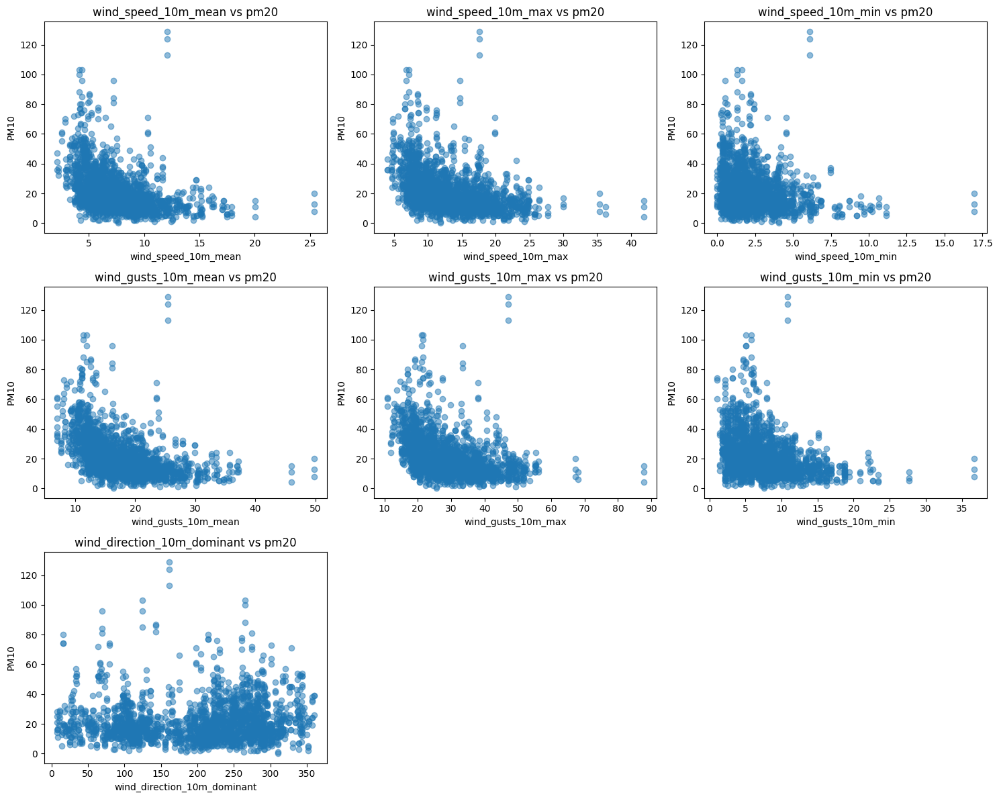

In [89]:
n = len(list_wind)
cols = 3
rows = math.ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 4))
axes = axes.flatten()

for i, col in enumerate(list_wind):
    axes[i].scatter(df_finale[col], df_finale['PM10'], alpha=0.5)
    axes[i].set_title(f'{col} vs pm20')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('PM10')

# elimina assi vuoti
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

### Information Value confronto PM10

L'IV serve per la feature selection.
Compara la distribuzione delle variabili per la target con la distribuzione per la non target.

Ha un vaore che va da zero a infinito -> valori alti = più forte capacità predittiva

Formula:
IV = ∑ (Good Distribution — Bad Distribution) * Weight of Evidence

+ Good distribution: % nella distribuzione per cui la target è 0 dato un valore della feature
+ Bad distribution: % nella distribuzione per cui la target è 1 dato un valore della feature
+ Weight of Evidence = ln(Good Distribution/Bad Distribution) -> se è positivo ci sono più zeri che 1, se è negativo è il contrario

WOE - Come calcolarla:
Dividi in bins le variabili numeriche
Calcola il numero di eventi e non-eventi in ogni gruppo (eventi: pm10 > 50)
Calcola le % di eventi e non eventi in ogni gruppo
Calcola il WOE dividendo % di non-event a quella di eventi

IV
Less than 0.02	Not useful for prediction
0.02 to 0.1	Weak predictive Power
0.1 to 0.3	Medium predictive Power
0.3 to 0.5	Strong predictive Power
oltre 0.5	Suspicious Predictive Power


In [90]:
features = list_wind
target = 'target_pm10'  # 1 = sopra soglia, 0 = sotto

# prendi solo le colonne che ti servono
df_sub = df_finale[features + [target]]

# calcolo IV solo su queste
iv_df = sc.iv(df_sub, y=target)

In [91]:
iv_df.head(20).style.background_gradient(vmin=0, vmax=.5).format(precision=2)

,variable,info_value
4,wind_gusts_10m_max,0.93
1,wind_gusts_10m_min,0.83
6,wind_speed_10m_min,0.63
0,wind_gusts_10m_mean,0.33
2,wind_speed_10m_max,0.31
5,wind_direction_10m_dominant,0.23
3,wind_speed_10m_mean,0.22


### Confronto e scelta

confronto le correlazioni, le associazioni e la capacità predittiva rispetto al PM10

In [92]:
display(
    iv_df.head(20).style.background_gradient(vmin=0, vmax=.5).format(precision=2),
    df_couples.head(20).style.background_gradient(vmin=0, vmax=.3).format(precision=2),
    df_corr_p.head(20).style.background_gradient(vmin=0, vmax=.3).format(precision=2),
    df_corr_s.head(20).style.background_gradient(vmin=0, vmax=.3).format(precision=2)

)

,variable,info_value
4,wind_gusts_10m_max,0.93
1,wind_gusts_10m_min,0.83
6,wind_speed_10m_min,0.63
0,wind_gusts_10m_mean,0.33
2,wind_speed_10m_max,0.31
5,wind_direction_10m_dominant,0.23
3,wind_speed_10m_mean,0.22


,var-x,var-y,v-score
3,wind_gusts_10m_mean,target_pm10,0.37
0,wind_speed_10m_mean,target_pm10,0.32
1,wind_speed_10m_max,target_pm10,0.28
4,wind_gusts_10m_max,target_pm10,0.24
5,wind_gusts_10m_min,target_pm10,0.20
6,wind_direction_10m_dominant,target_pm10,0.17
2,wind_speed_10m_min,target_pm10,0.16


,varA,correlation,varB
0,wind_gusts_10m_mean,0.21,target_pm10
1,wind_speed_10m_mean,0.19,target_pm10
2,wind_speed_10m_max,0.17,target_pm10
3,wind_gusts_10m_max,0.16,target_pm10
4,wind_gusts_10m_min,0.15,target_pm10
5,wind_speed_10m_min,0.11,target_pm10
6,wind_direction_10m_dominant,0.02,target_pm10


,varA,correlation,varB
0,wind_gusts_10m_mean,0.25,target_pm10
1,wind_speed_10m_mean,0.23,target_pm10
2,wind_speed_10m_max,0.19,target_pm10
3,wind_gusts_10m_max,0.19,target_pm10
4,wind_gusts_10m_min,0.18,target_pm10
5,wind_speed_10m_min,0.14,target_pm10
6,wind_direction_10m_dominant,0.02,target_pm10


Intanto una cosa interessante qui, come già visto prima, i valori _max sono più ppredittivi ma i _mean sono più correlati. In generale il vento  una variabile importantissima per lo studio del PM10: il vento forte porta a una maggiore dispersione del PM, ma quando è troppo forte porta anche a una dispersione delle polveri, il che può essere impattante al contrario, interessante prendere il _mean. wind_gusts_10m_ sono le RAFFICHE. Qui può essere interessante la relazione con il vento in quanto definisce la situazione di aumento delle polveri descritto prima. Invece per usare wind probabilmente dovremmo trasformarla con sin e cos perchè riguarda i 360 gradi.

In [93]:
list_wind_update = ['wind_speed_10m_mean','wind_speed_10m_min','wind_gusts_10m_max','wind_direction_10m_dominant']

## Precipitations

In [94]:
list_precipitation = [
        'precipitation_sum', 'precipitation_hours',
        'snowfall_sum', 'snowfall_water_equivalent_sum']

In [95]:
list_precipitation

['precipitation_sum',
 'precipitation_hours',
 'snowfall_sum',
 'snowfall_water_equivalent_sum']

### Correlazione di Pearson

In [96]:
# correlazione tra le variabili

corr_matrix = df_finale[list_precipitation].corr(numeric_only=True, method='pearson')

list_corr = []
cols = corr_matrix.columns.tolist()

for ii, i in enumerate(cols[:-1]):
    for jj, j in enumerate(cols[ii+1:]):
        list_corr.append([i, j, corr_matrix.loc[i, j]])

df_corr = pd.DataFrame(list_corr, columns=['varA', 'varB', 'correlation'])
df_corr = df_corr.sort_values('correlation', ascending=False, key=abs)

df_corr.loc[df_corr['correlation'] > 0.5,:]

,varA,varB,correlation
5,snowfall_sum,snowfall_water_equivalent_sum,1.000000
0,precipitation_sum,precipitation_hours,0.776831


Notiamo subito come le correlazioni siano piuttosto basse rispetto alle altre variabili a parte snowfall_sum e snowfall_water... che sono palesemente la stessa variabile

### Correlazione di Spearman

In [97]:
corr_matrix = df_finale[list_precipitation].corr(numeric_only=True, method='spearman')

list_corr = []
cols = corr_matrix.columns.tolist()

for ii, i in enumerate(cols[:-1]):
    for jj, j in enumerate(cols[ii+1:]):
        list_corr.append([i, j, corr_matrix.loc[i, j]])

df_corr = pd.DataFrame(list_corr, columns=['varA', 'varB', 'correlation'])
df_corr = df_corr.sort_values('correlation', ascending=False, key=abs)

df_corr.loc[df_corr['correlation'] > 0.5,:]

,varA,varB,correlation
5,snowfall_sum,snowfall_water_equivalent_sum,1.000000
0,precipitation_sum,precipitation_hours,0.982384


### v-score

In [98]:
df_vscore = df_finale.copy()

for k in list_precipitation :   # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                     # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].unique()))}) # ... resetting labels

In [99]:
df_vscore.columns

Index(['giorno', 'PM10', 'temperature_2m_mean', 'temperature_2m_max',
       'temperature_2m_min', 'apparent_temperature_mean',
       'apparent_temperature_max', 'apparent_temperature_min',
       'wind_speed_10m_max', 'wind_gusts_10m_max',
       'wind_direction_10m_dominant', 'shortwave_radiation_sum',
       'et0_fao_evapotranspiration', 'daylight_duration', 'sunshine_duration',
       'precipitation_sum', 'snowfall_sum', 'precipitation_hours',
       'cloud_cover_mean', 'cloud_cover_max', 'cloud_cover_min',
       'dew_point_2m_mean', 'dew_point_2m_max', 'dew_point_2m_min',
       'wet_bulb_temperature_2m_mean', 'wet_bulb_temperature_2m_max',
       'wet_bulb_temperature_2m_min', 'vapour_pressure_deficit_max',
       'soil_moisture_0_to_7cm_mean', 'soil_moisture_0_to_100cm_mean',
       'soil_moisture_28_to_100cm_mean', 'soil_moisture_7_to_28cm_mean',
       'soil_temperature_0_to_100cm_mean', 'soil_temperature_0_to_7cm_mean',
       'soil_temperature_28_to_100cm_mean', 'soil_temp

In [100]:
df_vscore['precipitation_sum'].value_counts()

precipitation_sum
bin00    1170
bin01     121
bin04     107
bin07     105
bin08     105
bin09     104
bin06     103
bin05      99
bin03      96
bin02      80
Name: count, dtype: int64

In [101]:
list_vscores = []

list_vars_vscore = list_precipitation
list_vars_vscore = list(df_vscore[list_vars_vscore].nunique().sort_values(ascending=False).index)

for ii, i in enumerate(list_vars_vscore[:-1]) :
    for jj, j in enumerate(list_vars_vscore[ii+1:]) :

        df_contingency = df_vscore.groupby([i,j]).agg({'giorno':'count'})
        df_contingency = df_contingency.unstack().replace(0, np.nan)
        df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
        df_contingency = df_contingency.fillna(0).astype(int)

        r, c = df_contingency.shape
        n = df_contingency.sum().sum()

        vscore = scp_cont.association(df_contingency.values, method="tschuprow")
        vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
        vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
        vscore = np.sqrt(vscore)

        list_vscores.append([i,j,vscore])

df_vscore = pd.DataFrame(list_vscores, columns=['varA', 'varB', 'v-score'])
df_vscore = df_vscore.sort_values('v-score', ascending=False)

c:\Users\Boom\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\scipy\stats\contingency.py:519: RuntimeWarning: invalid value encountered in scalar divide
  value = phi2 / math.sqrt((n_rows - 1) * (n_cols - 1))
C:\Users\Boom\AppData\Local\Temp\ipykernel_14568\1706091988.py:19: RuntimeWarning: invalid value encountered in scalar divide
  vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
c:\Users\Boom\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\scipy\stats\contingency.py:519: RuntimeWarning: invalid value encountered in scalar divide
  value = phi2 / math.sqrt((n_rows - 1) * (n_cols - 1))
C:\Users\Boom\AppData\Local\Temp\ipykernel_14568\1706091988.py:19: RuntimeWarning: invalid value encountered in scalar divide
  vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
c:\Users\Boom\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\scipy\stats\contingency.py:519: RuntimeWarning: invalid value encountered in scalar divide
  value = phi2 / math.sqrt((n_rows 

In [102]:
df_vscore.head(50).style.background_gradient(vmin=0, vmax=1).format(precision=2)

,varA,varB,v-score
0,precipitation_sum,precipitation_hours,0.51
1,precipitation_sum,snowfall_sum,nan
2,precipitation_sum,snowfall_water_equivalent_sum,nan
3,precipitation_hours,snowfall_sum,nan
4,precipitation_hours,snowfall_water_equivalent_sum,nan
5,snowfall_sum,snowfall_water_equivalent_sum,nan


qui il vscore non funziona perchè le nevicate sono state pochissime e le altre due variabili sono uguali

In [103]:
# ora guardo il vscore a tre
df_vscore = df_finale.copy()

for k in list_precipitation :   # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                     # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].unique()))}) # ... resetting labels

In [104]:
list_vscores = []

list_vars_vscore = list_precipitation
list_vars_vscore = list(df_vscore[list_vars_vscore].nunique().sort_values(ascending=False).index)

for ii, i in enumerate(list_vars_vscore[:-2]) :
    for jj, j in enumerate(list_vars_vscore[ii+1:-1]) :
        for kk, k in enumerate(list_vars_vscore[ii+jj+2:]) :

            df_contingency = df_vscore.groupby([i,j,k]).agg({'giorno':'count'})
            df_contingency = df_contingency.unstack().replace(0, np.nan)
            df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
            df_contingency = df_contingency.fillna(0).astype(int)

            r, c = df_contingency.shape
            n = df_contingency.sum().sum()

            #vscore = scp_cont.association(df_contingency.values, method="cramer") # no - sovrastima le numeriche
            vscore = scp_cont.association(df_contingency.values, method="tschuprow")
            vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
            vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
            vscore = np.sqrt(vscore)

            list_vscores.append([i,j,k,vscore])

df_vscore = pd.DataFrame(list_vscores, columns=['varA0', 'varA1', 'varB', 'v-score'])
df_vscore = df_vscore.sort_values('v-score', ascending=False)

c:\Users\Boom\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\scipy\stats\contingency.py:519: RuntimeWarning: invalid value encountered in scalar divide
  value = phi2 / math.sqrt((n_rows - 1) * (n_cols - 1))
C:\Users\Boom\AppData\Local\Temp\ipykernel_14568\4141214217.py:21: RuntimeWarning: invalid value encountered in scalar divide
  vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
c:\Users\Boom\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\scipy\stats\contingency.py:519: RuntimeWarning: invalid value encountered in scalar divide
  value = phi2 / math.sqrt((n_rows - 1) * (n_cols - 1))
C:\Users\Boom\AppData\Local\Temp\ipykernel_14568\4141214217.py:21: RuntimeWarning: invalid value encountered in scalar divide
  vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
c:\Users\Boom\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\scipy\stats\contingency.py:519: RuntimeWarning: invalid value encountered in scalar divide
  value = phi2 / math.sqrt((n_rows 

In [105]:
df_vscore.head(20).style.background_gradient(vmin=.9, vmax=1).format(precision=2)

,varA0,varA1,varB,v-score
0,precipitation_sum,precipitation_hours,snowfall_sum,nan
1,precipitation_sum,precipitation_hours,snowfall_water_equivalent_sum,nan
2,precipitation_sum,snowfall_sum,snowfall_water_equivalent_sum,nan
3,precipitation_hours,snowfall_sum,snowfall_water_equivalent_sum,nan


### Scatter Plot

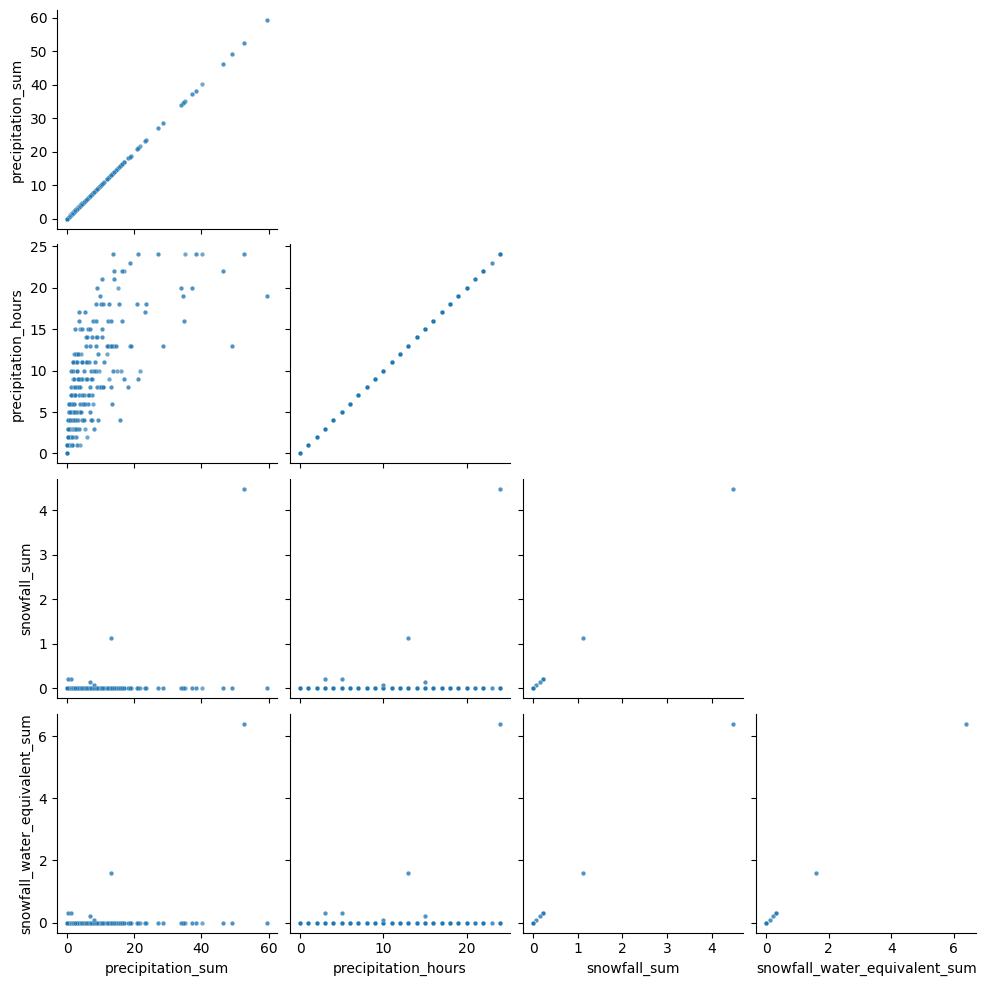

In [106]:
sns.pairplot(
    df_finale[list_precipitation],
    diag_kind=None,
    corner=True,
    plot_kws={'s': 10, 'alpha': 0.4}
)

### Confronto con PM10

### Correlazione di Pearson confronto PM10

In [107]:
df_corr_p = (
    df_finale[list_precipitation]
    .corrwith(df_finale["target_pm10"])
    .abs()
    .sort_values(ascending=False)
    .reset_index()
)

df_corr_p.columns = ["varA", "correlation"]
df_corr_p["varB"] = "target_pm10"

df_corr_p

,varA,correlation,varB
0,precipitation_sum,0.048018,target_pm10
1,precipitation_hours,0.012849,target_pm10
2,snowfall_water_equivalent_sum,0.011016,target_pm10
3,snowfall_sum,0.011016,target_pm10


### Correlazione di Spearman confronto PM10

In [108]:
df_corr_s = (
    df_finale[list_precipitation]
    .corrwith(df_finale["target_pm10"], method='spearman')
    .abs()
    .sort_values(ascending=False)
    .reset_index()
)

df_corr_s.columns = ["varA", "correlation"]
df_corr_s["varB"] = "target_pm10"

df_corr_s

,varA,correlation,varB
0,snowfall_water_equivalent_sum,0.020114,target_pm10
1,snowfall_sum,0.020114,target_pm10
2,precipitation_sum,0.015099,target_pm10
3,precipitation_hours,0.000389,target_pm10


### v-score confronto PM10

In [109]:
df_vscore = df_finale.copy()

for k in list_precipitation :   # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                                # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].dropna().unique()))})   # ... resetting labels

In [110]:
list_vscores = []

list_vars_vscore = list_precipitation
list_vars_vscore = list(df_vscore[list_vars_vscore].nunique().sort_values(ascending=False).index)

for ii, i in enumerate(list_vars_vscore) :

    df_contingency = df_vscore.groupby([i,'target_pm10']).agg({'giorno':'count'})
    df_contingency = df_contingency.unstack().replace(0, np.nan)
    df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
    df_contingency = df_contingency.fillna(0).astype(int)

    r, c = df_contingency.shape
    n = df_contingency.sum().sum()

    vscore = scp_cont.association(df_contingency.values, method="tschuprow")
    vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
    vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
    vscore = np.sqrt(vscore)

    list_vscores.append([i,'target_pm10',vscore])

df_couples = pd.DataFrame(list_vscores, columns=['var-x', 'var-y', 'v-score'])
df_couples = df_couples.sort_values('v-score', ascending=False)

c:\Users\Boom\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\scipy\stats\contingency.py:519: RuntimeWarning: invalid value encountered in scalar divide
  value = phi2 / math.sqrt((n_rows - 1) * (n_cols - 1))
C:\Users\Boom\AppData\Local\Temp\ipykernel_14568\2487021743.py:18: RuntimeWarning: invalid value encountered in scalar divide
  vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
c:\Users\Boom\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\scipy\stats\contingency.py:519: RuntimeWarning: invalid value encountered in scalar divide
  value = phi2 / math.sqrt((n_rows - 1) * (n_cols - 1))
C:\Users\Boom\AppData\Local\Temp\ipykernel_14568\2487021743.py:18: RuntimeWarning: invalid value encountered in scalar divide
  vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )


In [111]:
df_couples.head(12).style.background_gradient(vmin=0, vmax=.3).format(precision=2)

,var-x,var-y,v-score
0,precipitation_sum,target_pm10,0.08
1,precipitation_hours,target_pm10,0.06
2,snowfall_sum,target_pm10,nan
3,snowfall_water_equivalent_sum,target_pm10,nan


In [112]:
df_vscore = df_finale.copy()

for k in list_precipitation :                # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                                  # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].dropna().unique()))})     # ... resetting labels

In [113]:
for ii, i in enumerate(list_vars_vscore[:-1]) :
    for jj, j in enumerate(list_vars_vscore[ii+1:]) :

        df_contingency = df_vscore.groupby([i,j,'target_pm10']).agg({'giorno':'count'})
        df_contingency = df_contingency.unstack().replace(0, np.nan)
        df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
        df_contingency = df_contingency.fillna(0).astype(int)

        r, c = df_contingency.shape
        n = df_contingency.sum().sum()

        vscore = scp_cont.association(df_contingency.values, method="tschuprow")
        vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
        vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
        vscore = np.sqrt(vscore)

        list_vscores.append([i,j,'target_pm10',vscore])

df_triplets = pd.DataFrame(list_vscores, columns=['var-x0', 'var-x1', 'var-y', 'v-score'])
df_triplets = df_triplets.sort_values('v-score', ascending=False)

c:\Users\Boom\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\scipy\stats\contingency.py:519: RuntimeWarning: invalid value encountered in scalar divide
  value = phi2 / math.sqrt((n_rows - 1) * (n_cols - 1))
C:\Users\Boom\AppData\Local\Temp\ipykernel_14568\1113872257.py:14: RuntimeWarning: invalid value encountered in scalar divide
  vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )


In [114]:
df_triplets.head(10).style.background_gradient(vmin=0, vmax=.5).format(precision=2)

,var-x0,var-x1,var-y,v-score
4,precipitation_sum,precipitation_hours,target_pm10,0.15
5,precipitation_sum,snowfall_sum,target_pm10,0.08
6,precipitation_sum,snowfall_water_equivalent_sum,target_pm10,0.08
7,precipitation_hours,snowfall_sum,target_pm10,0.06
8,precipitation_hours,snowfall_water_equivalent_sum,target_pm10,0.06
0,precipitation_sum,target_pm10,0.08,nan
1,precipitation_hours,target_pm10,0.06,nan
2,snowfall_sum,target_pm10,nan,nan
3,snowfall_water_equivalent_sum,target_pm10,nan,nan
9,snowfall_sum,snowfall_water_equivalent_sum,target_pm10,nan


### Scatter Plot confronto PM10

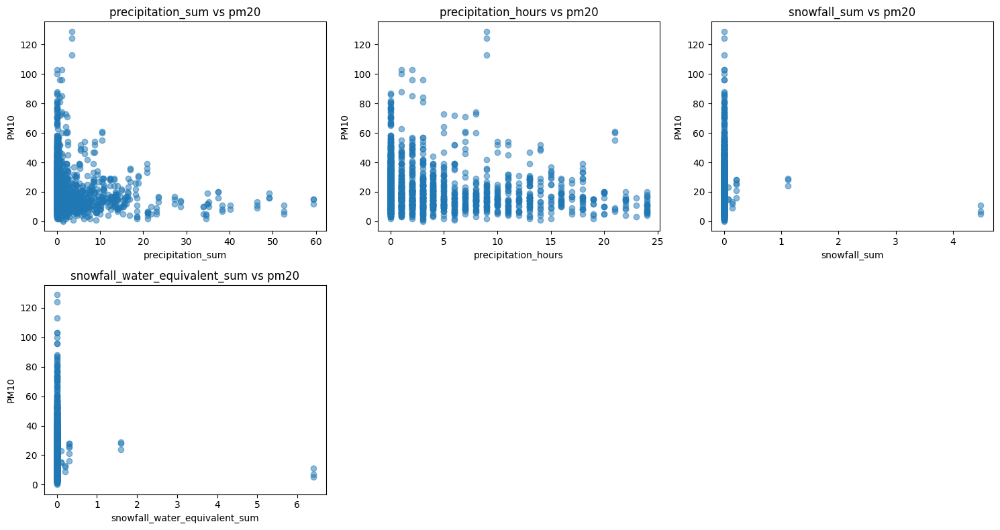

In [115]:
n = len(list_precipitation)
cols = 3
rows = math.ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 4))
axes = axes.flatten()

for i, col in enumerate(list_precipitation):
    axes[i].scatter(df_finale[col], df_finale['PM10'], alpha=0.5)
    axes[i].set_title(f'{col} vs pm20')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('PM10')

# elimina assi vuoti
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

### Information Value confronto PM10

L'IV serve per la feature selection.
Compara la distribuzione delle variabili per la target con la distribuzione per la non target.

Ha un vaore che va da zero a infinito -> valori alti = più forte capacità predittiva

Formula:
IV = ∑ (Good Distribution — Bad Distribution) * Weight of Evidence

+ Good distribution: % nella distribuzione per cui la target è 0 dato un valore della feature
+ Bad distribution: % nella distribuzione per cui la target è 1 dato un valore della feature
+ Weight of Evidence = ln(Good Distribution/Bad Distribution) -> se è positivo ci sono più zeri che 1, se è negativo è il contrario

WOE - Come calcolarla:
Dividi in bins le variabili numeriche
Calcola il numero di eventi e non-eventi in ogni gruppo (eventi: pm10 > 50)
Calcola le % di eventi e non eventi in ogni gruppo
Calcola il WOE dividendo % di non-event a quella di eventi

IV
Less than 0.02	Not useful for prediction
0.02 to 0.1	Weak predictive Power
0.1 to 0.3	Medium predictive Power
0.3 to 0.5	Strong predictive Power
oltre 0.5	Suspicious Predictive Power


In [116]:
features = list_precipitation
target = 'target_pm10'  # 1 = sopra soglia, 0 = sotto

# prendi solo le colonne che ti servono
df_sub = df_finale[features + [target]]

# calcolo IV solo su queste
iv_df = sc.iv(df_sub, y=target)

In [117]:
iv_df.head(20).style.background_gradient(vmin=0, vmax=.5).format(precision=2)

,variable,info_value
1,precipitation_sum,0.86
2,precipitation_hours,0.23
0,snowfall_sum,0.06
3,snowfall_water_equivalent_sum,0.06


### Confronto e scelta

confronto le correlazioni, le associazioni e la capacità predittiva rispetto al PM10

In [118]:
display(
    iv_df.head(20).style.background_gradient(vmin=0, vmax=.5).format(precision=2),
    df_couples.head(20).style.background_gradient(vmin=0, vmax=.3).format(precision=2),
    df_corr_p.head(20).style.background_gradient(vmin=0, vmax=.3).format(precision=2),
    df_corr_s.head(20).style.background_gradient(vmin=0, vmax=.3).format(precision=2)

)

,variable,info_value
1,precipitation_sum,0.86
2,precipitation_hours,0.23
0,snowfall_sum,0.06
3,snowfall_water_equivalent_sum,0.06


,var-x,var-y,v-score
0,precipitation_sum,target_pm10,0.08
1,precipitation_hours,target_pm10,0.06
2,snowfall_sum,target_pm10,nan
3,snowfall_water_equivalent_sum,target_pm10,nan


,varA,correlation,varB
0,precipitation_sum,0.05,target_pm10
1,precipitation_hours,0.01,target_pm10
2,snowfall_water_equivalent_sum,0.01,target_pm10
3,snowfall_sum,0.01,target_pm10


,varA,correlation,varB
0,snowfall_water_equivalent_sum,0.02,target_pm10
1,snowfall_sum,0.02,target_pm10
2,precipitation_sum,0.02,target_pm10
3,precipitation_hours,0.00,target_pm10


Qui la storia è un po' diversa. Per ora teniamo precipitation che comunque è correlato, togliendo il suo uguale e togiamo snowfall: ci sono pochissimi eventi e tutti gli indici dicono che non ha senso tenerla

In [119]:
list_precipitation_update = ['precipitation_sum']

## Radiation sunlight

In [120]:
list_radiation =  [
        'shortwave_radiation_sum', 'sunshine_duration',
        'daylight_duration', 'sunrise_minutes', 'sunset_minutes']

In [121]:
list_radiation

['shortwave_radiation_sum',
 'sunshine_duration',
 'daylight_duration',
 'sunrise_minutes',
 'sunset_minutes']

### Correlazione di Pearson

In [122]:
# correlazione tra le variabili

corr_matrix = df_finale[list_radiation].corr(numeric_only=True, method='pearson')

list_corr = []
cols = corr_matrix.columns.tolist()

for ii, i in enumerate(cols[:-1]):
    for jj, j in enumerate(cols[ii+1:]):
        list_corr.append([i, j, corr_matrix.loc[i, j]])

df_corr = pd.DataFrame(list_corr, columns=['varA', 'varB', 'correlation'])
df_corr = df_corr.sort_values('correlation', ascending=False, key=abs)

df_corr.loc[df_corr['correlation'] > 0.5,:]

,varA,varB,correlation
8,daylight_duration,sunset_minutes,0.992330
0,shortwave_radiation_sum,sunshine_duration,0.895966
1,shortwave_radiation_sum,daylight_duration,0.890281
3,shortwave_radiation_sum,sunset_minutes,0.884198
4,sunshine_duration,daylight_duration,0.658535
6,sunshine_duration,sunset_minutes,0.650193


Notiamo subito come le correlazioni siano piuttosto basse rispetto alle altre variabili a parte snowfall_sum e snowfall_water... che sono palesemente la stessa variabile

### Correlazione di Spearman

In [123]:
corr_matrix = df_finale[list_radiation].corr(numeric_only=True, method='spearman')

list_corr = []
cols = corr_matrix.columns.tolist()

for ii, i in enumerate(cols[:-1]):
    for jj, j in enumerate(cols[ii+1:]):
        list_corr.append([i, j, corr_matrix.loc[i, j]])

df_corr = pd.DataFrame(list_corr, columns=['varA', 'varB', 'correlation'])
df_corr = df_corr.sort_values('correlation', ascending=False, key=abs)

df_corr.loc[df_corr['correlation'] > 0.5,:]

,varA,varB,correlation
8,daylight_duration,sunset_minutes,0.990392
0,shortwave_radiation_sum,sunshine_duration,0.938788
1,shortwave_radiation_sum,daylight_duration,0.882825
3,shortwave_radiation_sum,sunset_minutes,0.876816
4,sunshine_duration,daylight_duration,0.729801
6,sunshine_duration,sunset_minutes,0.726025


### v-score

In [124]:
df_vscore = df_finale.copy()

for k in list_radiation :   # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                     # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].unique()))}) # ... resetting labels

In [125]:
list_vscores = []

list_vars_vscore = list_radiation
list_vars_vscore = list(df_vscore[list_vars_vscore].nunique().sort_values(ascending=False).index)

for ii, i in enumerate(list_vars_vscore[:-1]) :
    for jj, j in enumerate(list_vars_vscore[ii+1:]) :

        df_contingency = df_vscore.groupby([i,j]).agg({'giorno':'count'})
        df_contingency = df_contingency.unstack().replace(0, np.nan)
        df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
        df_contingency = df_contingency.fillna(0).astype(int)

        r, c = df_contingency.shape
        n = df_contingency.sum().sum()

        vscore = scp_cont.association(df_contingency.values, method="tschuprow")
        vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
        vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
        vscore = np.sqrt(vscore)

        list_vscores.append([i,j,vscore])

df_vscore = pd.DataFrame(list_vscores, columns=['varA', 'varB', 'v-score'])
df_vscore = df_vscore.sort_values('v-score', ascending=False)

In [126]:
df_vscore.head(50).style.background_gradient(vmin=0, vmax=1).format(precision=2)

,varA,varB,v-score
5,daylight_duration,sunset_minutes,0.65
4,daylight_duration,sunrise_minutes,0.64
7,sunrise_minutes,sunset_minutes,0.59
3,shortwave_radiation_sum,sunshine_duration,0.44
6,daylight_duration,sunshine_duration,0.36
9,sunset_minutes,sunshine_duration,0.35
0,shortwave_radiation_sum,daylight_duration,0.35
8,sunrise_minutes,sunshine_duration,0.35
1,shortwave_radiation_sum,sunrise_minutes,0.33
2,shortwave_radiation_sum,sunset_minutes,0.33


qui il vscore non funziona perchè le nevicate sono state pochissime e le altre due variabili sono uguali

In [127]:
# ora guardo il vscore a tre
df_vscore = df_finale.copy()

for k in list_radiation :   # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                     # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].unique()))}) # ... resetting labels

In [128]:
list_vscores = []

list_vars_vscore = list_radiation
list_vars_vscore = list(df_vscore[list_vars_vscore].nunique().sort_values(ascending=False).index)

for ii, i in enumerate(list_vars_vscore[:-2]) :
    for jj, j in enumerate(list_vars_vscore[ii+1:-1]) :
        for kk, k in enumerate(list_vars_vscore[ii+jj+2:]) :

            df_contingency = df_vscore.groupby([i,j,k]).agg({'giorno':'count'})
            df_contingency = df_contingency.unstack().replace(0, np.nan)
            df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
            df_contingency = df_contingency.fillna(0).astype(int)

            r, c = df_contingency.shape
            n = df_contingency.sum().sum()

            #vscore = scp_cont.association(df_contingency.values, method="cramer") # no - sovrastima le numeriche
            vscore = scp_cont.association(df_contingency.values, method="tschuprow")
            vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
            vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
            vscore = np.sqrt(vscore)

            list_vscores.append([i,j,k,vscore])

df_vscore = pd.DataFrame(list_vscores, columns=['varA0', 'varA1', 'varB', 'v-score'])
df_vscore = df_vscore.sort_values('v-score', ascending=False)

In [129]:
df_vscore.head(20).style.background_gradient(vmin=.9, vmax=1).format(precision=2)

,varA0,varA1,varB,v-score
6,daylight_duration,sunrise_minutes,sunset_minutes,0.82
1,shortwave_radiation_sum,daylight_duration,sunset_minutes,0.74
0,shortwave_radiation_sum,daylight_duration,sunrise_minutes,0.73
3,shortwave_radiation_sum,sunrise_minutes,sunset_minutes,0.73
4,shortwave_radiation_sum,sunrise_minutes,sunshine_duration,0.68
5,shortwave_radiation_sum,sunset_minutes,sunshine_duration,0.67
2,shortwave_radiation_sum,daylight_duration,sunshine_duration,0.67
9,sunrise_minutes,sunset_minutes,sunshine_duration,0.46
7,daylight_duration,sunrise_minutes,sunshine_duration,0.46
8,daylight_duration,sunset_minutes,sunshine_duration,0.44


### Scatter Plot

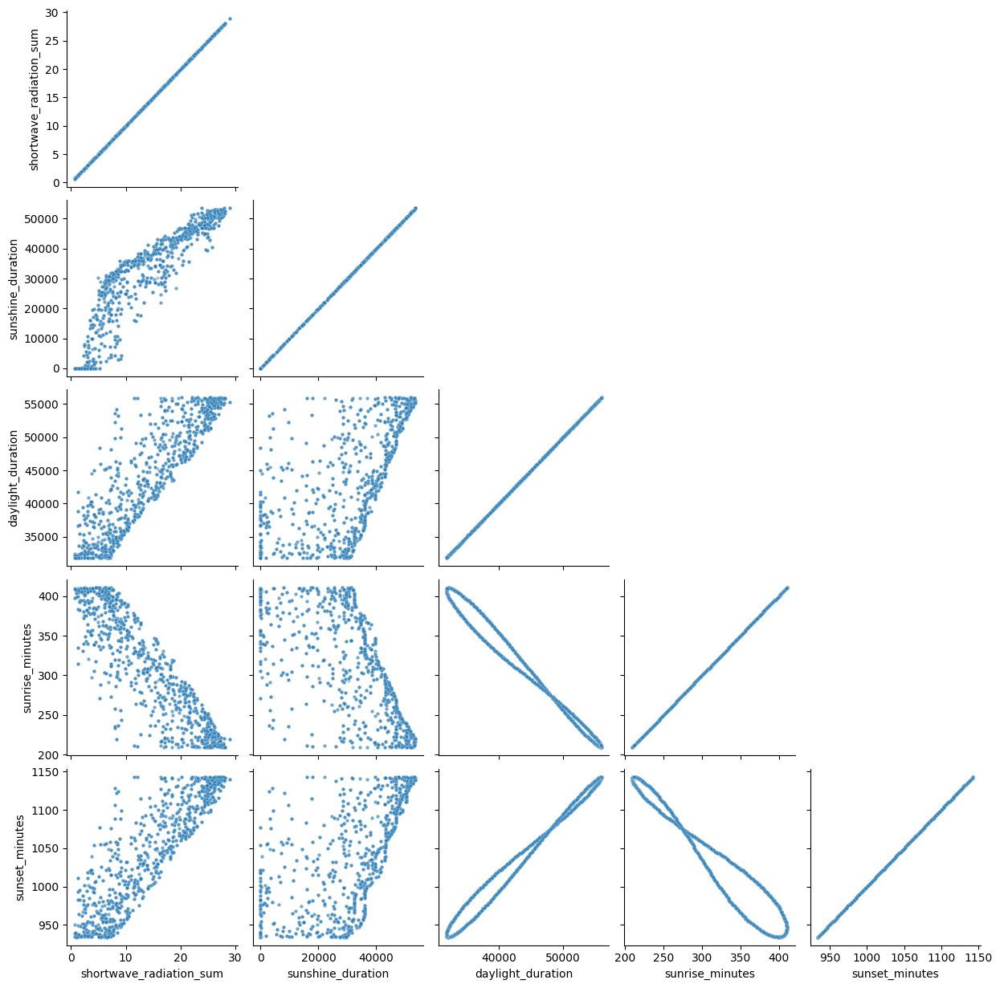

In [130]:
sns.pairplot(
    df_finale[list_radiation],
    diag_kind=None,
    corner=True,
    plot_kws={'s': 10, 'alpha': 0.4}
)

Sunset minutes, daylight durtion e sinrise minutes hanno una relazione non esattamente lineare ma en deinita, mentre sunshine duration e shoetwave radiation pure una relazione, ma non perfetta.

### Confronto con PM10

### Correlazione di Pearson confronto PM10

In [131]:
df_corr_p = (
    df_finale[list_radiation]
    .corrwith(df_finale["target_pm10"])
    .abs()
    .sort_values(ascending=False)
    .reset_index()
)

df_corr_p.columns = ["varA", "correlation"]
df_corr_p["varB"] = "target_pm10"

df_corr_p

,varA,correlation,varB
0,sunrise_minutes,0.208960,target_pm10
1,daylight_duration,0.194270,target_pm10
2,shortwave_radiation_sum,0.188166,target_pm10
3,sunset_minutes,0.176912,target_pm10
4,sunshine_duration,0.159857,target_pm10


### Correlazione di Spearman confronto PM10

In [132]:
df_corr_s = (
    df_finale[list_radiation]
    .corrwith(df_finale["target_pm10"], method='spearman')
    .abs()
    .sort_values(ascending=False)
    .reset_index()
)

df_corr_s.columns = ["varA", "correlation"]
df_corr_s["varB"] = "target_pm10"

df_corr_s

,varA,correlation,varB
0,sunrise_minutes,0.203582,target_pm10
1,daylight_duration,0.188375,target_pm10
2,shortwave_radiation_sum,0.185203,target_pm10
3,sunshine_duration,0.173825,target_pm10
4,sunset_minutes,0.172268,target_pm10


### v-score confronto PM10

In [133]:
df_vscore = df_finale.copy()

for k in list_radiation :   # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                                # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].dropna().unique()))})   # ... resetting labels

In [134]:
list_vscores = []

list_vars_vscore = list_radiation
list_vars_vscore = list(df_vscore[list_vars_vscore].nunique().sort_values(ascending=False).index)

for ii, i in enumerate(list_vars_vscore) :

    df_contingency = df_vscore.groupby([i,'target_pm10']).agg({'giorno':'count'})
    df_contingency = df_contingency.unstack().replace(0, np.nan)
    df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
    df_contingency = df_contingency.fillna(0).astype(int)

    r, c = df_contingency.shape
    n = df_contingency.sum().sum()

    vscore = scp_cont.association(df_contingency.values, method="tschuprow")
    vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
    vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
    vscore = np.sqrt(vscore)

    list_vscores.append([i,'target_pm10',vscore])

df_couples = pd.DataFrame(list_vscores, columns=['var-x', 'var-y', 'v-score'])
df_couples = df_couples.sort_values('v-score', ascending=False)

In [135]:
df_couples.head(12).style.background_gradient(vmin=0, vmax=.3).format(precision=2)

,var-x,var-y,v-score
3,sunset_minutes,target_pm10,0.29
1,daylight_duration,target_pm10,0.29
2,sunrise_minutes,target_pm10,0.28
0,shortwave_radiation_sum,target_pm10,0.25
4,sunshine_duration,target_pm10,0.19


In [136]:
df_vscore = df_finale.copy()

for k in list_radiation :                # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                                  # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].dropna().unique()))})     # ... resetting labels

In [137]:
for ii, i in enumerate(list_vars_vscore[:-1]) :
    for jj, j in enumerate(list_vars_vscore[ii+1:]) :

        df_contingency = df_vscore.groupby([i,j,'target_pm10']).agg({'giorno':'count'})
        df_contingency = df_contingency.unstack().replace(0, np.nan)
        df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
        df_contingency = df_contingency.fillna(0).astype(int)

        r, c = df_contingency.shape
        n = df_contingency.sum().sum()

        vscore = scp_cont.association(df_contingency.values, method="tschuprow")
        vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
        vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
        vscore = np.sqrt(vscore)

        list_vscores.append([i,j,'target_pm10',vscore])

df_triplets = pd.DataFrame(list_vscores, columns=['var-x0', 'var-x1', 'var-y', 'v-score'])
df_triplets = df_triplets.sort_values('v-score', ascending=False)

In [138]:
df_triplets.head(10).style.background_gradient(vmin=0, vmax=.5).format(precision=2)

,var-x0,var-x1,var-y,v-score
11,daylight_duration,sunshine_duration,target_pm10,0.49
14,sunset_minutes,sunshine_duration,target_pm10,0.49
7,shortwave_radiation_sum,sunset_minutes,target_pm10,0.47
12,sunrise_minutes,sunset_minutes,target_pm10,0.44
5,shortwave_radiation_sum,daylight_duration,target_pm10,0.42
9,daylight_duration,sunrise_minutes,target_pm10,0.41
10,daylight_duration,sunset_minutes,target_pm10,0.41
6,shortwave_radiation_sum,sunrise_minutes,target_pm10,0.40
8,shortwave_radiation_sum,sunshine_duration,target_pm10,0.38
13,sunrise_minutes,sunshine_duration,target_pm10,0.36


### Scatter Plot confronto PM10

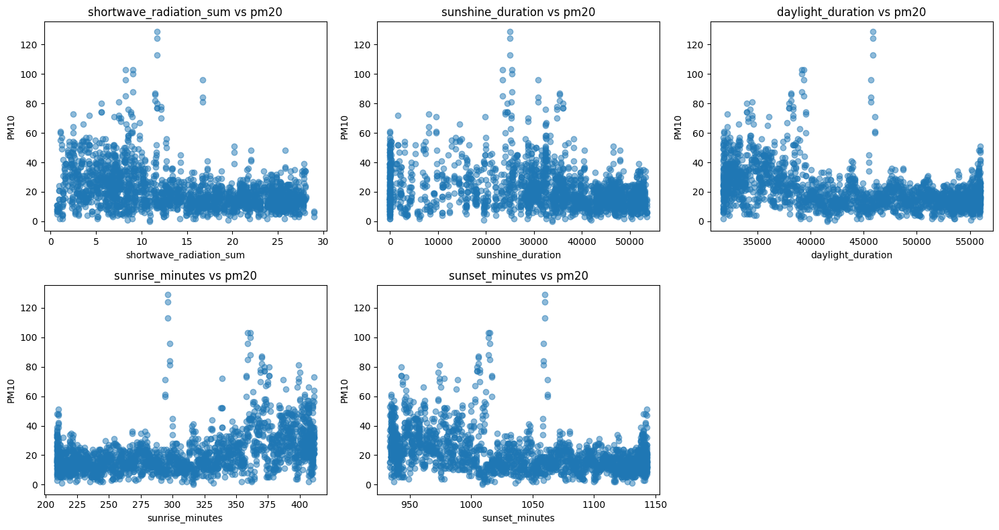

In [139]:
n = len(list_radiation)
cols = 3
rows = math.ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 4))
axes = axes.flatten()

for i, col in enumerate(list_radiation):
    axes[i].scatter(df_finale[col], df_finale['PM10'], alpha=0.5)
    axes[i].set_title(f'{col} vs pm20')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('PM10')

# elimina assi vuoti
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

### Information Value confronto PM10

L'IV serve per la feature selection.
Compara la distribuzione delle variabili per la target con la distribuzione per la non target.

Ha un vaore che va da zero a infinito -> valori alti = più forte capacità predittiva

Formula:
IV = ∑ (Good Distribution — Bad Distribution) * Weight of Evidence

+ Good distribution: % nella distribuzione per cui la target è 0 dato un valore della feature
+ Bad distribution: % nella distribuzione per cui la target è 1 dato un valore della feature
+ Weight of Evidence = ln(Good Distribution/Bad Distribution) -> se è positivo ci sono più zeri che 1, se è negativo è il contrario

WOE - Come calcolarla:
Dividi in bins le variabili numeriche
Calcola il numero di eventi e non-eventi in ogni gruppo (eventi: pm10 > 50)
Calcola le % di eventi e non eventi in ogni gruppo
Calcola il WOE dividendo % di non-event a quella di eventi

IV
Less than 0.02	Not useful for prediction
0.02 to 0.1	Weak predictive Power
0.1 to 0.3	Medium predictive Power
0.3 to 0.5	Strong predictive Power
oltre 0.5	Suspicious Predictive Power


In [140]:
features = list_radiation
target = 'target_pm10'  # 1 = sopra soglia, 0 = sotto

# prendi solo le colonne che ti servono
df_sub = df_finale[features + [target]]

# calcolo IV solo su queste
iv_df = sc.iv(df_sub, y=target)

In [141]:
iv_df.head(20).style.background_gradient(vmin=0, vmax=.5).format(precision=2)

,variable,info_value
3,sunset_minutes,0.59
4,sunrise_minutes,0.56
0,sunshine_duration,0.47
2,shortwave_radiation_sum,0.30
1,daylight_duration,0.22


### Confronto e scelta

confronto le correlazioni, le associazioni e la capacità predittiva rispetto al PM10

In [142]:

display(
    iv_df.head(20).style.background_gradient(vmin=0, vmax=.5).format(precision=2),
    df_couples.head(20).style.background_gradient(vmin=0, vmax=.3).format(precision=2),
    df_corr_p.head(20).style.background_gradient(vmin=0, vmax=.3).format(precision=2),
    df_corr_s.head(20).style.background_gradient(vmin=0, vmax=.3).format(precision=2)

)

,variable,info_value
3,sunset_minutes,0.59
4,sunrise_minutes,0.56
0,sunshine_duration,0.47
2,shortwave_radiation_sum,0.30
1,daylight_duration,0.22


,var-x,var-y,v-score
3,sunset_minutes,target_pm10,0.29
1,daylight_duration,target_pm10,0.29
2,sunrise_minutes,target_pm10,0.28
0,shortwave_radiation_sum,target_pm10,0.25
4,sunshine_duration,target_pm10,0.19


,varA,correlation,varB
0,sunrise_minutes,0.21,target_pm10
1,daylight_duration,0.19,target_pm10
2,shortwave_radiation_sum,0.19,target_pm10
3,sunset_minutes,0.18,target_pm10
4,sunshine_duration,0.16,target_pm10


,varA,correlation,varB
0,sunrise_minutes,0.20,target_pm10
1,daylight_duration,0.19,target_pm10
2,shortwave_radiation_sum,0.19,target_pm10
3,sunshine_duration,0.17,target_pm10
4,sunset_minutes,0.17,target_pm10


Le variabili indicano shortwave_radiation_sum energia solare ricevuta durante il giorno: se è alta l'aria si scalda e il PM10 diminuisce.

sunshine_duration è simile alla radiazione ma meno preciso della radiation.
daylight_duration come sopra praticamente, è un po' una proxy della stagione

sunrise e sunset mi danno le stesse info della daylight. Quindi decido di prendere la shortwave perchè ha indici simili alla sunshine ma è più precisa. E sunset minutes. 

In [143]:
list_radiation_update = ['shortwave_radiation_sum', 'sunset_minutes']

## Clouds

In [144]:
list_cloud = [
        'cloud_cover_mean', 'cloud_cover_max', 'cloud_cover_min']

In [145]:
list_cloud

['cloud_cover_mean', 'cloud_cover_max', 'cloud_cover_min']

### Correlazione di Pearson

In [146]:
# correlazione tra le variabili

corr_matrix = df_finale[list_cloud].corr(numeric_only=True, method='pearson')

list_corr = []
cols = corr_matrix.columns.tolist()

for ii, i in enumerate(cols[:-1]):
    for jj, j in enumerate(cols[ii+1:]):
        list_corr.append([i, j, corr_matrix.loc[i, j]])

df_corr = pd.DataFrame(list_corr, columns=['varA', 'varB', 'correlation'])
df_corr = df_corr.sort_values('correlation', ascending=False, key=abs)

df_corr.loc[df_corr['correlation'] > 0.5,:]

,varA,varB,correlation
1,cloud_cover_mean,cloud_cover_min,0.686441
0,cloud_cover_mean,cloud_cover_max,0.639857


Hanno correlazioni medio alte tra loro

### Correlazione di Spearman

In [147]:
corr_matrix = df_finale[list_cloud].corr(numeric_only=True, method='spearman')

list_corr = []
cols = corr_matrix.columns.tolist()

for ii, i in enumerate(cols[:-1]):
    for jj, j in enumerate(cols[ii+1:]):
        list_corr.append([i, j, corr_matrix.loc[i, j]])

df_corr = pd.DataFrame(list_corr, columns=['varA', 'varB', 'correlation'])
df_corr = df_corr.sort_values('correlation', ascending=False, key=abs)

df_corr.loc[df_corr['correlation'] > 0.5,:]

,varA,varB,correlation
1,cloud_cover_mean,cloud_cover_min,0.833258
0,cloud_cover_mean,cloud_cover_max,0.760737
2,cloud_cover_max,cloud_cover_min,0.500455


### v-score

In [148]:
df_vscore = df_finale.copy()

for k in list_cloud :   # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                     # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].unique()))}) # ... resetting labels

In [149]:
list_vscores = []

list_vars_vscore = list_cloud
list_vars_vscore = list(df_vscore[list_vars_vscore].nunique().sort_values(ascending=False).index)

for ii, i in enumerate(list_vars_vscore[:-1]) :
    for jj, j in enumerate(list_vars_vscore[ii+1:]) :

        df_contingency = df_vscore.groupby([i,j]).agg({'giorno':'count'})
        df_contingency = df_contingency.unstack().replace(0, np.nan)
        df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
        df_contingency = df_contingency.fillna(0).astype(int)

        r, c = df_contingency.shape
        n = df_contingency.sum().sum()

        vscore = scp_cont.association(df_contingency.values, method="tschuprow")
        vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
        vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
        vscore = np.sqrt(vscore)

        list_vscores.append([i,j,vscore])

df_vscore = pd.DataFrame(list_vscores, columns=['varA', 'varB', 'v-score'])
df_vscore = df_vscore.sort_values('v-score', ascending=False)

In [150]:
df_vscore.head(50).style.background_gradient(vmin=0, vmax=1).format(precision=2)

,varA,varB,v-score
1,cloud_cover_mean,cloud_cover_max,0.61
0,cloud_cover_mean,cloud_cover_min,0.53
2,cloud_cover_min,cloud_cover_max,0.19


Min e max sono poco associate ma poi con mean entrambe abbstanza

In [151]:
# ora guardo il vscore a tre
df_vscore = df_finale.copy()

for k in list_cloud :   # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                     # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].unique()))}) # ... resetting labels

In [152]:
list_vscores = []

list_vars_vscore = list_cloud
list_vars_vscore = list(df_vscore[list_vars_vscore].nunique().sort_values(ascending=False).index)

for ii, i in enumerate(list_vars_vscore[:-2]) :
    for jj, j in enumerate(list_vars_vscore[ii+1:-1]) :
        for kk, k in enumerate(list_vars_vscore[ii+jj+2:]) :

            df_contingency = df_vscore.groupby([i,j,k]).agg({'giorno':'count'})
            df_contingency = df_contingency.unstack().replace(0, np.nan)
            df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
            df_contingency = df_contingency.fillna(0).astype(int)

            r, c = df_contingency.shape
            n = df_contingency.sum().sum()

            #vscore = scp_cont.association(df_contingency.values, method="cramer") # no - sovrastima le numeriche
            vscore = scp_cont.association(df_contingency.values, method="tschuprow")
            vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
            vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
            vscore = np.sqrt(vscore)

            list_vscores.append([i,j,k,vscore])

df_vscore = pd.DataFrame(list_vscores, columns=['varA0', 'varA1', 'varB', 'v-score'])
df_vscore = df_vscore.sort_values('v-score', ascending=False)

In [153]:
df_vscore.head(20).style.background_gradient(vmin=.9, vmax=1).format(precision=2)

,varA0,varA1,varB,v-score
0,cloud_cover_mean,cloud_cover_min,cloud_cover_max,0.60


### Scatter Plot

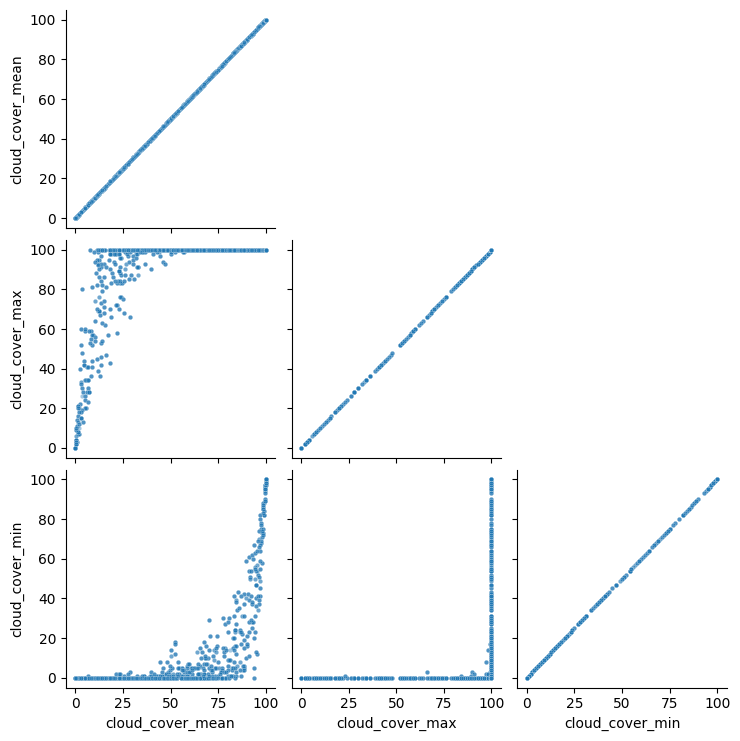

In [154]:
sns.pairplot(
    df_finale[list_cloud],
    diag_kind=None,
    corner=True,
    plot_kws={'s': 10, 'alpha': 0.4}
)

Sunset minutes, daylight durtion e sinrise minutes hanno una relazione non esattamente lineare ma en deinita, mentre sunshine duration e shoetwave radiation pure una relazione, ma non perfetta.

### Confronto con PM10

### Correlazione di Pearson confronto PM10

In [155]:
df_corr_p = (
    df_finale[list_cloud]
    .corrwith(df_finale["target_pm10"])
    .abs()
    .sort_values(ascending=False)
    .reset_index()
)

df_corr_p.columns = ["varA", "correlation"]
df_corr_p["varB"] = "target_pm10"

df_corr_p

,varA,correlation,varB
0,cloud_cover_mean,0.156218,target_pm10
1,cloud_cover_min,0.129750,target_pm10
2,cloud_cover_max,0.079722,target_pm10


### Correlazione di Spearman confronto PM10

In [156]:
df_corr_s = (
    df_finale[list_cloud]
    .corrwith(df_finale["target_pm10"], method='spearman')
    .abs()
    .sort_values(ascending=False)
    .reset_index()
)

df_corr_s.columns = ["varA", "correlation"]
df_corr_s["varB"] = "target_pm10"

df_corr_s

,varA,correlation,varB
0,cloud_cover_mean,0.155558,target_pm10
1,cloud_cover_min,0.146482,target_pm10
2,cloud_cover_max,0.097661,target_pm10


### v-score confronto PM10

In [157]:
df_vscore = df_finale.copy()

for k in list_cloud :   # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                                # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].dropna().unique()))})   # ... resetting labels

In [158]:
list_vscores = []

list_vars_vscore = list_cloud
list_vars_vscore = list(df_vscore[list_vars_vscore].nunique().sort_values(ascending=False).index)

for ii, i in enumerate(list_vars_vscore) :

    df_contingency = df_vscore.groupby([i,'target_pm10']).agg({'giorno':'count'})
    df_contingency = df_contingency.unstack().replace(0, np.nan)
    df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
    df_contingency = df_contingency.fillna(0).astype(int)

    r, c = df_contingency.shape
    n = df_contingency.sum().sum()

    vscore = scp_cont.association(df_contingency.values, method="tschuprow")
    vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
    vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
    vscore = np.sqrt(vscore)

    list_vscores.append([i,'target_pm10',vscore])

df_couples = pd.DataFrame(list_vscores, columns=['var-x', 'var-y', 'v-score'])
df_couples = df_couples.sort_values('v-score', ascending=False)

In [159]:
df_couples.head(12).style.background_gradient(vmin=0, vmax=.3).format(precision=2)

,var-x,var-y,v-score
0,cloud_cover_mean,target_pm10,0.18
1,cloud_cover_min,target_pm10,0.17
2,cloud_cover_max,target_pm10,0.08


In [160]:
df_vscore = df_finale.copy()

for k in list_cloud :                # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                                  # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].dropna().unique()))})     # ... resetting labels

In [161]:
for ii, i in enumerate(list_vars_vscore[:-1]) :
    for jj, j in enumerate(list_vars_vscore[ii+1:]) :

        df_contingency = df_vscore.groupby([i,j,'target_pm10']).agg({'giorno':'count'})
        df_contingency = df_contingency.unstack().replace(0, np.nan)
        df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
        df_contingency = df_contingency.fillna(0).astype(int)

        r, c = df_contingency.shape
        n = df_contingency.sum().sum()

        vscore = scp_cont.association(df_contingency.values, method="tschuprow")
        vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
        vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
        vscore = np.sqrt(vscore)

        list_vscores.append([i,j,'target_pm10',vscore])

df_triplets = pd.DataFrame(list_vscores, columns=['var-x0', 'var-x1', 'var-y', 'v-score'])
df_triplets = df_triplets.sort_values('v-score', ascending=False)

In [162]:
df_triplets.head(10).style.background_gradient(vmin=0, vmax=.5).format(precision=2)

,var-x0,var-x1,var-y,v-score
3,cloud_cover_mean,cloud_cover_min,target_pm10,0.23
5,cloud_cover_min,cloud_cover_max,target_pm10,0.16
4,cloud_cover_mean,cloud_cover_max,target_pm10,0.16
0,cloud_cover_mean,target_pm10,0.18,nan
1,cloud_cover_min,target_pm10,0.17,nan
2,cloud_cover_max,target_pm10,0.08,nan


### Scatter Plot confronto PM10

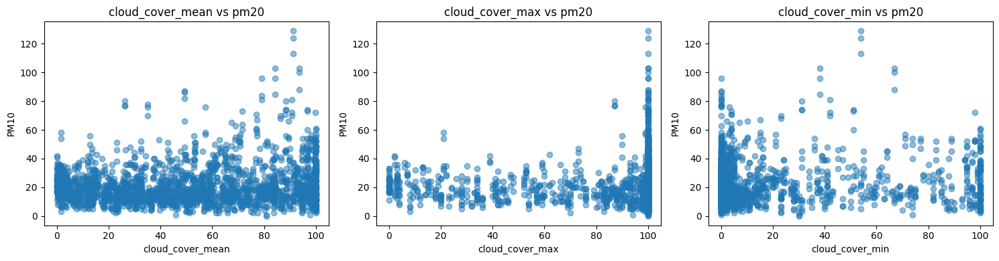

In [163]:
n = len(list_cloud)
cols = 3
rows = math.ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 4))
axes = axes.flatten()

for i, col in enumerate(list_cloud):
    axes[i].scatter(df_finale[col], df_finale['PM10'], alpha=0.5)
    axes[i].set_title(f'{col} vs pm20')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('PM10')

# elimina assi vuoti
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

### Information Value confronto PM10

L'IV serve per la feature selection.
Compara la distribuzione delle variabili per la target con la distribuzione per la non target.

Ha un vaore che va da zero a infinito -> valori alti = più forte capacità predittiva

Formula:
IV = ∑ (Good Distribution — Bad Distribution) * Weight of Evidence

+ Good distribution: % nella distribuzione per cui la target è 0 dato un valore della feature
+ Bad distribution: % nella distribuzione per cui la target è 1 dato un valore della feature
+ Weight of Evidence = ln(Good Distribution/Bad Distribution) -> se è positivo ci sono più zeri che 1, se è negativo è il contrario

WOE - Come calcolarla:
Dividi in bins le variabili numeriche
Calcola il numero di eventi e non-eventi in ogni gruppo (eventi: pm10 > 50)
Calcola le % di eventi e non eventi in ogni gruppo
Calcola il WOE dividendo % di non-event a quella di eventi

IV
Less than 0.02	Not useful for prediction
0.02 to 0.1	Weak predictive Power
0.1 to 0.3	Medium predictive Power
0.3 to 0.5	Strong predictive Power
oltre 0.5	Suspicious Predictive Power


In [164]:
features = list_cloud
target = 'target_pm10'  # 1 = sopra soglia, 0 = sotto

# prendi solo le colonne che ti servono
df_sub = df_finale[features + [target]]

# calcolo IV solo su queste
iv_df = sc.iv(df_sub, y=target)

In [165]:
iv_df.head(20).style.background_gradient(vmin=0, vmax=.5).format(precision=2)

,variable,info_value
1,cloud_cover_min,1.43
2,cloud_cover_mean,0.35
0,cloud_cover_max,0.34


Interessante come la _mean fosse la più correlata ma poi _min sembra essere il miglior predittore

### Confronto e scelta

confronto le correlazioni, le associazioni e la capacità predittiva rispetto al PM10

In [166]:
display(
    iv_df.head(20).style.background_gradient(vmin=0, vmax=.5).format(precision=2),
    df_couples.head(20).style.background_gradient(vmin=0, vmax=.3).format(precision=2),
    df_corr_p.head(20).style.background_gradient(vmin=0, vmax=.3).format(precision=2),
    df_corr_s.head(20).style.background_gradient(vmin=0, vmax=.3).format(precision=2)

)

,variable,info_value
1,cloud_cover_min,1.43
2,cloud_cover_mean,0.35
0,cloud_cover_max,0.34


,var-x,var-y,v-score
0,cloud_cover_mean,target_pm10,0.18
1,cloud_cover_min,target_pm10,0.17
2,cloud_cover_max,target_pm10,0.08


,varA,correlation,varB
0,cloud_cover_mean,0.16,target_pm10
1,cloud_cover_min,0.13,target_pm10
2,cloud_cover_max,0.08,target_pm10


,varA,correlation,varB
0,cloud_cover_mean,0.16,target_pm10
1,cloud_cover_min,0.15,target_pm10
2,cloud_cover_max,0.10,target_pm10


Non troppo sicura di questa quindi tengo due

In [167]:
list_cloud_update = ['cloud_cover_min','cloud_cover_mean']

## Soil

In [168]:
list_soil = [
        'soil_temperature_0_to_7cm_mean', 'soil_temperature_7_to_28cm_mean',
        'soil_temperature_28_to_100cm_mean', 'soil_temperature_0_to_100cm_mean',
        'soil_moisture_0_to_7cm_mean', 'soil_moisture_7_to_28cm_mean',
        'soil_moisture_28_to_100cm_mean', 'soil_moisture_0_to_100cm_mean']

In [169]:
list_soil

['soil_temperature_0_to_7cm_mean',
 'soil_temperature_7_to_28cm_mean',
 'soil_temperature_28_to_100cm_mean',
 'soil_temperature_0_to_100cm_mean',
 'soil_moisture_0_to_7cm_mean',
 'soil_moisture_7_to_28cm_mean',
 'soil_moisture_28_to_100cm_mean',
 'soil_moisture_0_to_100cm_mean']

### Correlazione di Pearson

In [170]:
# correlazione tra le variabili

corr_matrix = df_finale[list_soil].corr(numeric_only=True, method='pearson')

list_corr = []
cols = corr_matrix.columns.tolist()

for ii, i in enumerate(cols[:-1]):
    for jj, j in enumerate(cols[ii+1:]):
        list_corr.append([i, j, corr_matrix.loc[i, j]])

df_corr = pd.DataFrame(list_corr, columns=['varA', 'varB', 'correlation'])
df_corr = df_corr.sort_values('correlation', ascending=False, key=abs)

df_corr.loc[df_corr['correlation'] > 0.5,:]

,varA,varB,correlation
13,soil_temperature_28_to_100cm_mean,soil_temperature_0_to_100cm_mean,0.993133
0,soil_temperature_0_to_7cm_mean,soil_temperature_7_to_28cm_mean,0.992980
27,soil_moisture_28_to_100cm_mean,soil_moisture_0_to_100cm_mean,0.980021
8,soil_temperature_7_to_28cm_mean,soil_temperature_0_to_100cm_mean,0.978363
2,soil_temperature_0_to_7cm_mean,soil_temperature_0_to_100cm_mean,0.953479
7,soil_temperature_7_to_28cm_mean,soil_temperature_28_to_100cm_mean,0.947543
1,soil_temperature_0_to_7cm_mean,soil_temperature_28_to_100cm_mean,0.912206
22,soil_moisture_0_to_7cm_mean,soil_moisture_7_to_28cm_mean,0.910123
26,soil_moisture_7_to_28cm_mean,soil_moisture_0_to_100cm_mean,0.898880
25,soil_moisture_7_to_28cm_mean,soil_moisture_28_to_100cm_mean,0.796839


Hanno correlazioni medio alte tra loro

### Correlazione di Spearman

In [171]:
corr_matrix = df_finale[list_soil].corr(numeric_only=True, method='spearman')

list_corr = []
cols = corr_matrix.columns.tolist()

for ii, i in enumerate(cols[:-1]):
    for jj, j in enumerate(cols[ii+1:]):
        list_corr.append([i, j, corr_matrix.loc[i, j]])

df_corr = pd.DataFrame(list_corr, columns=['varA', 'varB', 'correlation'])
df_corr = df_corr.sort_values('correlation', ascending=False, key=abs)

df_corr.loc[df_corr['correlation'] > 0.5,:]

,varA,varB,correlation
0,soil_temperature_0_to_7cm_mean,soil_temperature_7_to_28cm_mean,0.992739
13,soil_temperature_28_to_100cm_mean,soil_temperature_0_to_100cm_mean,0.992326
27,soil_moisture_28_to_100cm_mean,soil_moisture_0_to_100cm_mean,0.981564
8,soil_temperature_7_to_28cm_mean,soil_temperature_0_to_100cm_mean,0.976282
2,soil_temperature_0_to_7cm_mean,soil_temperature_0_to_100cm_mean,0.952184
7,soil_temperature_7_to_28cm_mean,soil_temperature_28_to_100cm_mean,0.944903
22,soil_moisture_0_to_7cm_mean,soil_moisture_7_to_28cm_mean,0.925535
1,soil_temperature_0_to_7cm_mean,soil_temperature_28_to_100cm_mean,0.911218
26,soil_moisture_7_to_28cm_mean,soil_moisture_0_to_100cm_mean,0.877968
25,soil_moisture_7_to_28cm_mean,soil_moisture_28_to_100cm_mean,0.795132


### v-score

In [172]:
df_vscore = df_finale.copy()

for k in list_soil :   # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                     # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].unique()))}) # ... resetting labels

In [173]:
list_vscores = []

list_vars_vscore = list_soil
list_vars_vscore = list(df_vscore[list_vars_vscore].nunique().sort_values(ascending=False).index)

for ii, i in enumerate(list_vars_vscore[:-1]) :
    for jj, j in enumerate(list_vars_vscore[ii+1:]) :

        df_contingency = df_vscore.groupby([i,j]).agg({'giorno':'count'})
        df_contingency = df_contingency.unstack().replace(0, np.nan)
        df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
        df_contingency = df_contingency.fillna(0).astype(int)

        r, c = df_contingency.shape
        n = df_contingency.sum().sum()

        vscore = scp_cont.association(df_contingency.values, method="tschuprow")
        vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
        vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
        vscore = np.sqrt(vscore)

        list_vscores.append([i,j,vscore])

df_vscore = pd.DataFrame(list_vscores, columns=['varA', 'varB', 'v-score'])
df_vscore = df_vscore.sort_values('v-score', ascending=False)

In [174]:
df_vscore.head(50).style.background_gradient(vmin=0, vmax=1).format(precision=2)

,varA,varB,v-score
0,soil_temperature_0_to_7cm_mean,soil_temperature_7_to_28cm_mean,0.60
13,soil_temperature_28_to_100cm_mean,soil_temperature_0_to_100cm_mean,0.57
27,soil_moisture_28_to_100cm_mean,soil_moisture_0_to_100cm_mean,0.52
8,soil_temperature_7_to_28cm_mean,soil_temperature_0_to_100cm_mean,0.50
2,soil_temperature_0_to_7cm_mean,soil_temperature_0_to_100cm_mean,0.42
16,soil_temperature_28_to_100cm_mean,soil_moisture_28_to_100cm_mean,0.41
7,soil_temperature_7_to_28cm_mean,soil_temperature_28_to_100cm_mean,0.41
22,soil_moisture_0_to_7cm_mean,soil_moisture_7_to_28cm_mean,0.40
20,soil_temperature_0_to_100cm_mean,soil_moisture_28_to_100cm_mean,0.40
26,soil_moisture_7_to_28cm_mean,soil_moisture_0_to_100cm_mean,0.37


Min e max sono poco associate ma poi con mean entrambe abbstanza

In [175]:
# ora guardo il vscore a tre
df_vscore = df_finale.copy()

for k in list_soil :   # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                     # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].unique()))}) # ... resetting labels

In [176]:
list_vscores = []

list_vars_vscore = list_soil
list_vars_vscore = list(df_vscore[list_vars_vscore].nunique().sort_values(ascending=False).index)

for ii, i in enumerate(list_vars_vscore[:-2]) :
    for jj, j in enumerate(list_vars_vscore[ii+1:-1]) :
        for kk, k in enumerate(list_vars_vscore[ii+jj+2:]) :

            df_contingency = df_vscore.groupby([i,j,k]).agg({'giorno':'count'})
            df_contingency = df_contingency.unstack().replace(0, np.nan)
            df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
            df_contingency = df_contingency.fillna(0).astype(int)

            r, c = df_contingency.shape
            n = df_contingency.sum().sum()

            #vscore = scp_cont.association(df_contingency.values, method="cramer") # no - sovrastima le numeriche
            vscore = scp_cont.association(df_contingency.values, method="tschuprow")
            vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
            vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
            vscore = np.sqrt(vscore)

            list_vscores.append([i,j,k,vscore])

df_vscore = pd.DataFrame(list_vscores, columns=['varA0', 'varA1', 'varB', 'v-score'])
df_vscore = df_vscore.sort_values('v-score', ascending=False)

In [177]:
df_vscore.head(20).style.background_gradient(vmin=.9, vmax=1).format(precision=2)

,varA0,varA1,varB,v-score
21,soil_temperature_7_to_28cm_mean,soil_temperature_28_to_100cm_mean,soil_temperature_0_to_100cm_mean,0.87
6,soil_temperature_0_to_7cm_mean,soil_temperature_28_to_100cm_mean,soil_temperature_0_to_100cm_mean,0.86
55,soil_moisture_7_to_28cm_mean,soil_moisture_28_to_100cm_mean,soil_moisture_0_to_100cm_mean,0.83
54,soil_moisture_0_to_7cm_mean,soil_moisture_28_to_100cm_mean,soil_moisture_0_to_100cm_mean,0.83
43,soil_temperature_28_to_100cm_mean,soil_moisture_7_to_28cm_mean,soil_moisture_28_to_100cm_mean,0.75
49,soil_temperature_0_to_100cm_mean,soil_moisture_7_to_28cm_mean,soil_moisture_28_to_100cm_mean,0.74
45,soil_temperature_28_to_100cm_mean,soil_moisture_28_to_100cm_mean,soil_moisture_0_to_100cm_mean,0.72
51,soil_temperature_0_to_100cm_mean,soil_moisture_28_to_100cm_mean,soil_moisture_0_to_100cm_mean,0.72
35,soil_temperature_7_to_28cm_mean,soil_moisture_28_to_100cm_mean,soil_moisture_0_to_100cm_mean,0.71
33,soil_temperature_7_to_28cm_mean,soil_moisture_7_to_28cm_mean,soil_moisture_28_to_100cm_mean,0.71


### Scatter Plot

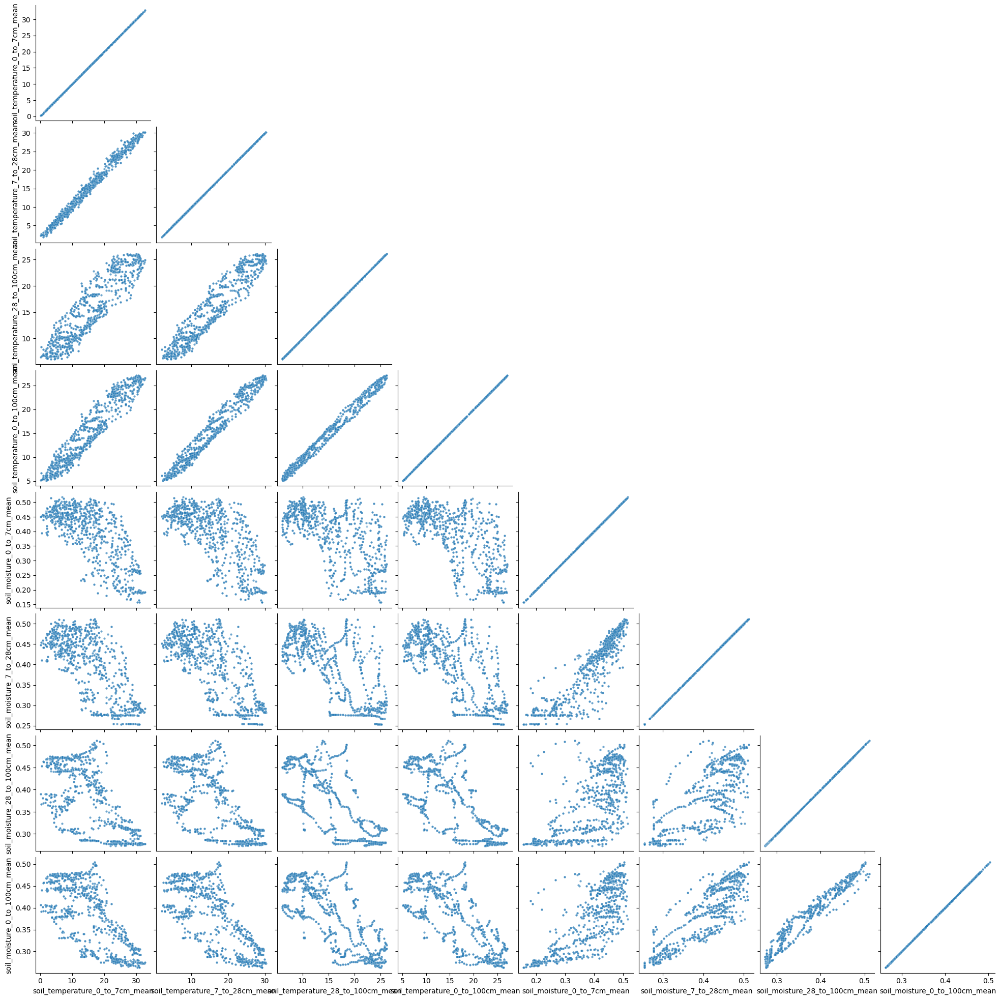

In [178]:
sns.pairplot(
    df_finale[list_soil],
    diag_kind=None,
    corner=True,
    plot_kws={'s': 10, 'alpha': 0.4}
)

Sunset minutes, daylight durtion e sinrise minutes hanno una relazione non esattamente lineare ma en deinita, mentre sunshine duration e shoetwave radiation pure una relazione, ma non perfetta.

### Confronto con PM10

### Correlazione di Pearson confronto PM10

In [179]:
df_corr_p = (
    df_finale[list_soil]
    .corrwith(df_finale["target_pm10"])
    .abs()
    .sort_values(ascending=False)
    .reset_index()
)

df_corr_p.columns = ["varA", "correlation"]
df_corr_p["varB"] = "target_pm10"

df_corr_p

,varA,correlation,varB
0,soil_temperature_0_to_100cm_mean,0.215160,target_pm10
1,soil_temperature_28_to_100cm_mean,0.213925,target_pm10
2,soil_temperature_7_to_28cm_mean,0.211371,target_pm10
3,soil_temperature_0_to_7cm_mean,0.200984,target_pm10
4,soil_moisture_0_to_100cm_mean,0.139412,target_pm10
5,soil_moisture_28_to_100cm_mean,0.134088,target_pm10
6,soil_moisture_7_to_28cm_mean,0.130040,target_pm10
7,soil_moisture_0_to_7cm_mean,0.119458,target_pm10


### Correlazione di Spearman confronto PM10

In [180]:
df_corr_s = (
    df_finale[list_soil]
    .corrwith(df_finale["target_pm10"], method='spearman')
    .abs()
    .sort_values(ascending=False)
    .reset_index()
)

df_corr_s.columns = ["varA", "correlation"]
df_corr_s["varB"] = "target_pm10"

df_corr_s

,varA,correlation,varB
0,soil_temperature_0_to_100cm_mean,0.223063,target_pm10
1,soil_temperature_28_to_100cm_mean,0.222898,target_pm10
2,soil_temperature_7_to_28cm_mean,0.215836,target_pm10
3,soil_temperature_0_to_7cm_mean,0.205658,target_pm10
4,soil_moisture_28_to_100cm_mean,0.128524,target_pm10
5,soil_moisture_0_to_100cm_mean,0.128150,target_pm10
6,soil_moisture_7_to_28cm_mean,0.104442,target_pm10
7,soil_moisture_0_to_7cm_mean,0.088551,target_pm10


### v-score confronto PM10

In [181]:
df_vscore = df_finale.copy()

for k in list_soil :   # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                                # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].dropna().unique()))})   # ... resetting labels

In [182]:
list_vscores = []

list_vars_vscore = list_soil
list_vars_vscore = list(df_vscore[list_vars_vscore].nunique().sort_values(ascending=False).index)

for ii, i in enumerate(list_vars_vscore) :

    df_contingency = df_vscore.groupby([i,'target_pm10']).agg({'giorno':'count'})
    df_contingency = df_contingency.unstack().replace(0, np.nan)
    df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
    df_contingency = df_contingency.fillna(0).astype(int)

    r, c = df_contingency.shape
    n = df_contingency.sum().sum()

    vscore = scp_cont.association(df_contingency.values, method="tschuprow")
    vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
    vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
    vscore = np.sqrt(vscore)

    list_vscores.append([i,'target_pm10',vscore])

df_couples = pd.DataFrame(list_vscores, columns=['var-x', 'var-y', 'v-score'])
df_couples = df_couples.sort_values('v-score', ascending=False)

In [183]:
df_couples.head(12).style.background_gradient(vmin=0, vmax=.3).format(precision=2)

,var-x,var-y,v-score
5,soil_moisture_7_to_28cm_mean,target_pm10,0.30
2,soil_temperature_28_to_100cm_mean,target_pm10,0.30
6,soil_moisture_28_to_100cm_mean,target_pm10,0.28
3,soil_temperature_0_to_100cm_mean,target_pm10,0.28
4,soil_moisture_0_to_7cm_mean,target_pm10,0.27
1,soil_temperature_7_to_28cm_mean,target_pm10,0.26
7,soil_moisture_0_to_100cm_mean,target_pm10,0.24
0,soil_temperature_0_to_7cm_mean,target_pm10,0.24


In [184]:
df_vscore = df_finale.copy()

for k in list_soil :                # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                                  # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].dropna().unique()))})     # ... resetting labels

In [185]:
for ii, i in enumerate(list_vars_vscore[:-1]) :
    for jj, j in enumerate(list_vars_vscore[ii+1:]) :

        df_contingency = df_vscore.groupby([i,j,'target_pm10']).agg({'giorno':'count'})
        df_contingency = df_contingency.unstack().replace(0, np.nan)
        df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
        df_contingency = df_contingency.fillna(0).astype(int)

        r, c = df_contingency.shape
        n = df_contingency.sum().sum()

        vscore = scp_cont.association(df_contingency.values, method="tschuprow")
        vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
        vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
        vscore = np.sqrt(vscore)

        list_vscores.append([i,j,'target_pm10',vscore])

df_triplets = pd.DataFrame(list_vscores, columns=['var-x0', 'var-x1', 'var-y', 'v-score'])
df_triplets = df_triplets.sort_values('v-score', ascending=False)

In [186]:
df_triplets.head(10).style.background_gradient(vmin=0, vmax=.5).format(precision=2)

,var-x0,var-x1,var-y,v-score
22,soil_temperature_28_to_100cm_mean,soil_moisture_0_to_7cm_mean,target_pm10,0.60
23,soil_temperature_28_to_100cm_mean,soil_moisture_7_to_28cm_mean,target_pm10,0.58
11,soil_temperature_0_to_7cm_mean,soil_moisture_0_to_7cm_mean,target_pm10,0.54
12,soil_temperature_0_to_7cm_mean,soil_moisture_7_to_28cm_mean,target_pm10,0.53
26,soil_temperature_0_to_100cm_mean,soil_moisture_0_to_7cm_mean,target_pm10,0.53
31,soil_moisture_0_to_7cm_mean,soil_moisture_28_to_100cm_mean,target_pm10,0.53
17,soil_temperature_7_to_28cm_mean,soil_moisture_0_to_7cm_mean,target_pm10,0.52
33,soil_moisture_7_to_28cm_mean,soil_moisture_28_to_100cm_mean,target_pm10,0.52
27,soil_temperature_0_to_100cm_mean,soil_moisture_7_to_28cm_mean,target_pm10,0.50
20,soil_temperature_7_to_28cm_mean,soil_moisture_0_to_100cm_mean,target_pm10,0.49


### Scatter Plot confronto PM10

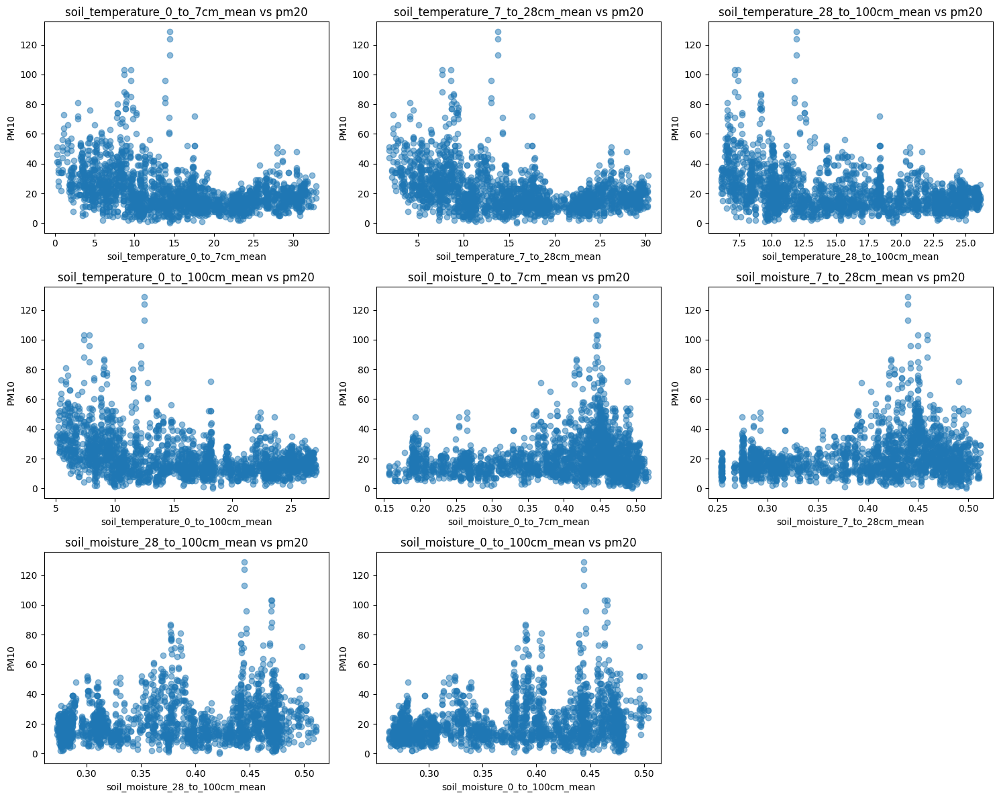

In [187]:
n = len(list_soil)
cols = 3
rows = math.ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 4))
axes = axes.flatten()

for i, col in enumerate(list_soil):
    axes[i].scatter(df_finale[col], df_finale['PM10'], alpha=0.5)
    axes[i].set_title(f'{col} vs pm20')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('PM10')

# elimina assi vuoti
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

### Information Value confronto PM10

L'IV serve per la feature selection.
Compara la distribuzione delle variabili per la target con la distribuzione per la non target.

Ha un vaore che va da zero a infinito -> valori alti = più forte capacità predittiva

Formula:
IV = ∑ (Good Distribution — Bad Distribution) * Weight of Evidence

+ Good distribution: % nella distribuzione per cui la target è 0 dato un valore della feature
+ Bad distribution: % nella distribuzione per cui la target è 1 dato un valore della feature
+ Weight of Evidence = ln(Good Distribution/Bad Distribution) -> se è positivo ci sono più zeri che 1, se è negativo è il contrario

WOE - Come calcolarla:
Dividi in bins le variabili numeriche
Calcola il numero di eventi e non-eventi in ogni gruppo (eventi: pm10 > 50)
Calcola le % di eventi e non eventi in ogni gruppo
Calcola il WOE dividendo % di non-event a quella di eventi

IV
Less than 0.02	Not useful for prediction
0.02 to 0.1	Weak predictive Power
0.1 to 0.3	Medium predictive Power
0.3 to 0.5	Strong predictive Power
oltre 0.5	Suspicious Predictive Power


In [188]:
features = list_soil
target = 'target_pm10'  # 1 = sopra soglia, 0 = sotto

# prendi solo le colonne che ti servono
df_sub = df_finale[features + [target]]

# calcolo IV solo su queste
iv_df = sc.iv(df_sub, y=target)

In [189]:
iv_df.head(20).style.background_gradient(vmin=0, vmax=.5).format(precision=2)

,variable,info_value
7,soil_moisture_28_to_100cm_mean,0.62
5,soil_moisture_7_to_28cm_mean,0.51
6,soil_temperature_28_to_100cm_mean,0.25
1,soil_moisture_0_to_7cm_mean,0.24
3,soil_temperature_7_to_28cm_mean,0.23
0,soil_temperature_0_to_7cm_mean,0.23
4,soil_moisture_0_to_100cm_mean,0.22
2,soil_temperature_0_to_100cm_mean,0.22


Interessante come la _mean fosse la più correlata ma poi _min sembra essere il miglior predittore

### Confronto e scelta

confronto le correlazioni, le associazioni e la capacità predittiva rispetto al PM10

In [190]:

display(
    iv_df.head(20).style.background_gradient(vmin=0, vmax=.5).format(precision=2),
    df_couples.head(20).style.background_gradient(vmin=0, vmax=.3).format(precision=2),
    df_corr_p.head(20).style.background_gradient(vmin=0, vmax=.3).format(precision=2),
    df_corr_s.head(20).style.background_gradient(vmin=0, vmax=.3).format(precision=2)

)

,variable,info_value
7,soil_moisture_28_to_100cm_mean,0.62
5,soil_moisture_7_to_28cm_mean,0.51
6,soil_temperature_28_to_100cm_mean,0.25
1,soil_moisture_0_to_7cm_mean,0.24
3,soil_temperature_7_to_28cm_mean,0.23
0,soil_temperature_0_to_7cm_mean,0.23
4,soil_moisture_0_to_100cm_mean,0.22
2,soil_temperature_0_to_100cm_mean,0.22


,var-x,var-y,v-score
5,soil_moisture_7_to_28cm_mean,target_pm10,0.30
2,soil_temperature_28_to_100cm_mean,target_pm10,0.30
6,soil_moisture_28_to_100cm_mean,target_pm10,0.28
3,soil_temperature_0_to_100cm_mean,target_pm10,0.28
4,soil_moisture_0_to_7cm_mean,target_pm10,0.27
1,soil_temperature_7_to_28cm_mean,target_pm10,0.26
7,soil_moisture_0_to_100cm_mean,target_pm10,0.24
0,soil_temperature_0_to_7cm_mean,target_pm10,0.24


,varA,correlation,varB
0,soil_temperature_0_to_100cm_mean,0.22,target_pm10
1,soil_temperature_28_to_100cm_mean,0.21,target_pm10
2,soil_temperature_7_to_28cm_mean,0.21,target_pm10
3,soil_temperature_0_to_7cm_mean,0.20,target_pm10
4,soil_moisture_0_to_100cm_mean,0.14,target_pm10
5,soil_moisture_28_to_100cm_mean,0.13,target_pm10
6,soil_moisture_7_to_28cm_mean,0.13,target_pm10
7,soil_moisture_0_to_7cm_mean,0.12,target_pm10


,varA,correlation,varB
0,soil_temperature_0_to_100cm_mean,0.22,target_pm10
1,soil_temperature_28_to_100cm_mean,0.22,target_pm10
2,soil_temperature_7_to_28cm_mean,0.22,target_pm10
3,soil_temperature_0_to_7cm_mean,0.21,target_pm10
4,soil_moisture_28_to_100cm_mean,0.13,target_pm10
5,soil_moisture_0_to_100cm_mean,0.13,target_pm10
6,soil_moisture_7_to_28cm_mean,0.10,target_pm10
7,soil_moisture_0_to_7cm_mean,0.09,target_pm10


Tra le varie soil temperature la più interessante è 0-7 cm perchè più legata all'atmosfera. Soil  mosture è molto interessante perchè indica la quantità di acqua nel suolo e quindi le polveri, comunque sempre meglio prendere 0-7. Una cosa interessante potrebbe essere interazione soil_mosture + vento! E comunque le misure di associazione sono tutte bassine. Prendo anche soil_moisture_28_to_100cm_mean perchè ha un IV alto-

In [191]:
list_soil_update = ['soil_moisture_28_to_100cm_mean','soil_moisture_0_to_7cm_mean','soil_temperature_0_to_7cm_mean']

## Altre

In [192]:
list_altre = ['et0_fao_evapotranspiration','weather_description']

# Studio delle associazioni per le variabili selezionate

In [193]:
list_var = list_pressure_update + list_precipitation_update + list_cloud_update + list_temperature_update + list_soil_update + list_wind_update + list_radiation_update + list_altre

### Correlazione di Pearson

In [194]:
# correlazione tra le variabili

corr_matrix = df_finale[list_var].corr(numeric_only=True, method='pearson')

list_corr = []
cols = corr_matrix.columns.tolist()

for ii, i in enumerate(cols[:-1]):
    for jj, j in enumerate(cols[ii+1:]):
        list_corr.append([i, j, corr_matrix.loc[i, j]])

df_corr = pd.DataFrame(list_corr, columns=['varA', 'varB', 'correlation'])
df_corr = df_corr.sort_values('correlation', ascending=False, key=abs)

df_corr.loc[df_corr['correlation'] > 0.6,:]

,varA,varB,correlation
83,temperature_2m_max,soil_temperature_0_to_7cm_mean,0.981930
134,shortwave_radiation_sum,et0_fao_evapotranspiration,0.954169
73,dew_point_2m_max,soil_temperature_0_to_7cm_mean,0.921052
90,temperature_2m_max,et0_fao_evapotranspiration,0.915121
70,dew_point_2m_max,temperature_2m_max,0.906021
114,soil_temperature_0_to_7cm_mean,et0_fao_evapotranspiration,0.892095
133,shortwave_radiation_sum,sunset_minutes,0.884198
135,sunset_minutes,et0_fao_evapotranspiration,0.879231
88,temperature_2m_max,shortwave_radiation_sum,0.834985
116,wind_speed_10m_mean,wind_gusts_10m_max,0.830728


### Correlazione di Spearman

In [195]:
corr_matrix = df_finale[list_var].corr(numeric_only=True, method='spearman')

list_corr = []
cols = corr_matrix.columns.tolist()

for ii, i in enumerate(cols[:-1]):
    for jj, j in enumerate(cols[ii+1:]):
        list_corr.append([i, j, corr_matrix.loc[i, j]])

df_corr = pd.DataFrame(list_corr, columns=['varA', 'varB', 'correlation'])
df_corr = df_corr.sort_values('correlation', ascending=False, key=abs)

df_corr.loc[df_corr['correlation'] > 0.6,:]

,varA,varB,correlation
83,temperature_2m_max,soil_temperature_0_to_7cm_mean,0.981254
134,shortwave_radiation_sum,et0_fao_evapotranspiration,0.967626
73,dew_point_2m_max,soil_temperature_0_to_7cm_mean,0.937670
70,dew_point_2m_max,temperature_2m_max,0.920180
90,temperature_2m_max,et0_fao_evapotranspiration,0.919761
135,sunset_minutes,et0_fao_evapotranspiration,0.892782
114,soil_temperature_0_to_7cm_mean,et0_fao_evapotranspiration,0.887698
133,shortwave_radiation_sum,sunset_minutes,0.876816
88,temperature_2m_max,shortwave_radiation_sum,0.835737
45,cloud_cover_min,cloud_cover_mean,0.833258


### v-score e 'weather description'

In [196]:
list_var_num =  list_pressure_update + list_precipitation_update + list_cloud_update + list_temperature_update + list_soil_update + list_wind_update + list_radiation_update
list_var_num.append('et0_fao_evapotranspiration')

list_var_cat = ['weather_description']

In [197]:
df_vscore = df_finale.copy()

for k in list_var_num :   # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                     # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].unique()))}) # ... resetting labels

In [198]:
list_vscores = []

list_vars_vscore = list_var_num + list_var_cat
list_vars_vscore = list(df_vscore[list_vars_vscore].nunique().sort_values(ascending=False).index)

for ii, i in enumerate(list_vars_vscore[:-1]) :
    for jj, j in enumerate(list_vars_vscore[ii+1:]) :

        df_contingency = df_vscore.groupby([i,j]).agg({'giorno':'count'})
        df_contingency = df_contingency.unstack().replace(0, np.nan)
        df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
        df_contingency = df_contingency.fillna(0).astype(int)

        r, c = df_contingency.shape
        n = df_contingency.sum().sum()

        vscore = scp_cont.association(df_contingency.values, method="tschuprow")
        vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
        vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
        vscore = np.sqrt(vscore)

        list_vscores.append([i,j,vscore])

df_vscore = pd.DataFrame(list_vscores, columns=['varA', 'varB', 'v-score'])
df_vscore = df_vscore.sort_values('v-score', ascending=False)

In [199]:
df_vscore.head(20).style.background_gradient(vmin=0, vmax=1).format(precision=2)

,varA,varB,v-score
151,precipitation_sum,weather_description,0.70
60,cloud_cover_mean,cloud_cover_min,0.53
76,temperature_2m_max,soil_temperature_0_to_7cm_mean,0.51
128,shortwave_radiation_sum,et0_fao_evapotranspiration,0.47
37,dew_point_2m_max,soil_temperature_0_to_7cm_mean,0.37
68,soil_moisture_28_to_100cm_mean,sunset_minutes,0.37
64,soil_moisture_28_to_100cm_mean,soil_temperature_0_to_7cm_mean,0.34
83,temperature_2m_max,et0_fao_evapotranspiration,0.34
61,cloud_cover_mean,weather_description,0.34
35,dew_point_2m_max,temperature_2m_max,0.33


In [200]:
# ora guardo il vscore a tre
df_vscore = df_finale.copy()

for k in list_var_num :   # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                     # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].unique()))}) # ... resetting labels

In [201]:
list_vscores = []

list_vars_vscore = list_var_num + list_var_cat
list_vars_vscore = list(df_vscore[list_vars_vscore].nunique().sort_values(ascending=False).index)

for ii, i in enumerate(list_vars_vscore[:-2]) :
    for jj, j in enumerate(list_vars_vscore[ii+1:-1]) :
        for kk, k in enumerate(list_vars_vscore[ii+jj+2:]) :

            df_contingency = df_vscore.groupby([i,j,k]).agg({'giorno':'count'})
            df_contingency = df_contingency.unstack().replace(0, np.nan)
            df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
            df_contingency = df_contingency.fillna(0).astype(int)

            r, c = df_contingency.shape
            n = df_contingency.sum().sum()

            #vscore = scp_cont.association(df_contingency.values, method="cramer") # no - sovrastima le numeriche
            vscore = scp_cont.association(df_contingency.values, method="tschuprow")
            vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
            vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
            vscore = np.sqrt(vscore)

            list_vscores.append([i,j,k,vscore])

df_vscore = pd.DataFrame(list_vscores, columns=['varA0', 'varA1', 'varB', 'v-score'])
df_vscore = df_vscore.sort_values('v-score', ascending=False)

In [202]:
df_vscore.head(20).style.background_gradient(vmin=.9, vmax=1).format(precision=2)

,varA0,varA1,varB,v-score
794,sunset_minutes,precipitation_sum,weather_description,0.85
758,wind_speed_10m_mean,precipitation_sum,weather_description,0.83
594,temperature_2m_max,precipitation_sum,weather_description,0.82
730,wind_speed_10m_min,precipitation_sum,weather_description,0.82
359,dew_point_2m_max,precipitation_sum,weather_description,0.82
810,wind_direction_10m_dominant,precipitation_sum,weather_description,0.81
254,relative_humidity_2m_min,precipitation_sum,weather_description,0.80
694,soil_temperature_0_to_7cm_mean,precipitation_sum,weather_description,0.79
528,soil_moisture_28_to_100cm_mean,precipitation_sum,weather_description,0.79
450,cloud_cover_mean,precipitation_sum,weather_description,0.78


### Scatter Plot

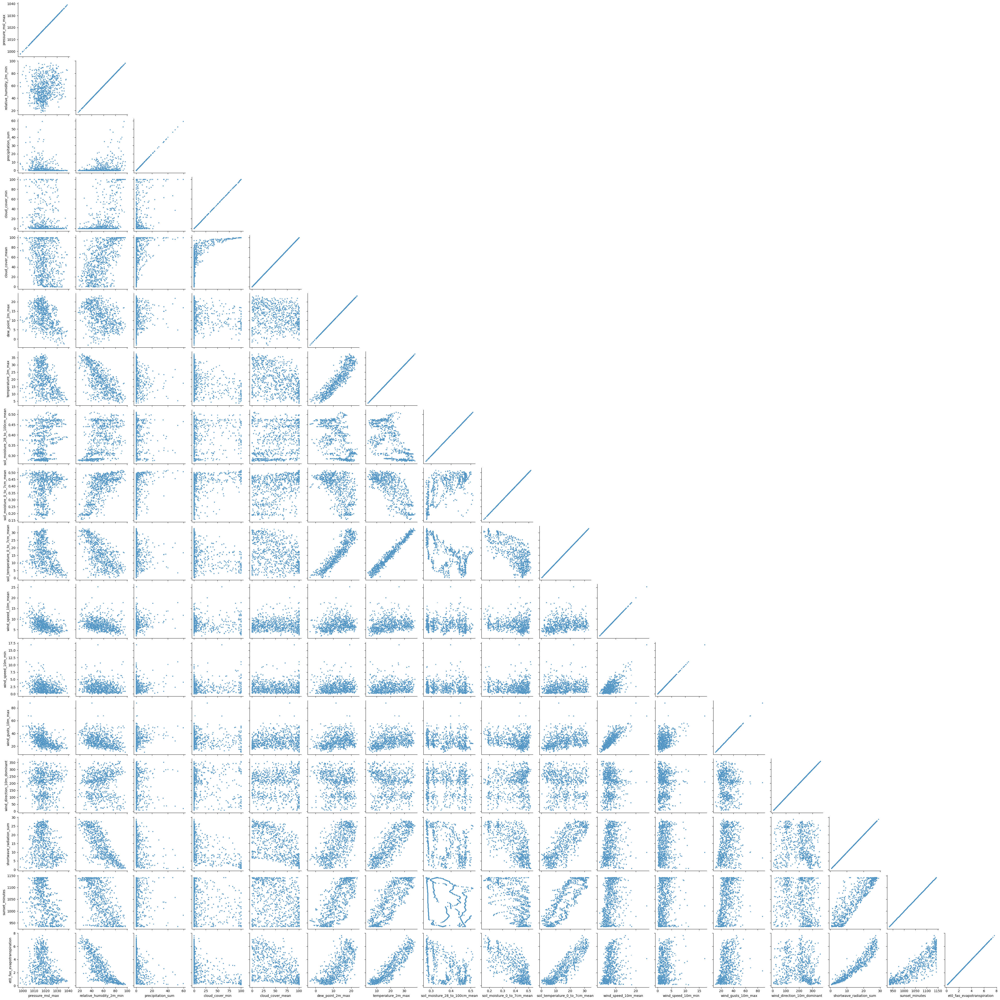

In [203]:
sns.pairplot(
    df_finale[list_var_num],
    diag_kind=None,
    corner=True,
    plot_kws={'s': 10, 'alpha': 0.4}
)

### Confronto con PM10

### Correlazione di Pearson confronto PM10

In [204]:
df_corr_p = (
    df_finale[list_var_num]
    .corrwith(df_finale["target_pm10"])
    .abs()
    .sort_values(ascending=False)
    .reset_index()
)

df_corr_p.columns = ["varA", "correlation"]
df_corr_p["varB"] = "target_pm10"

df_corr_p

,varA,correlation,varB
0,relative_humidity_2m_min,0.224716,target_pm10
1,soil_temperature_0_to_7cm_mean,0.200984,target_pm10
2,temperature_2m_max,0.192570,target_pm10
3,et0_fao_evapotranspiration,0.191130,target_pm10
4,shortwave_radiation_sum,0.188166,target_pm10
5,wind_speed_10m_mean,0.186976,target_pm10
6,sunset_minutes,0.176912,target_pm10
7,wind_gusts_10m_max,0.163605,target_pm10
8,cloud_cover_mean,0.156218,target_pm10
9,dew_point_2m_max,0.152834,target_pm10


### Correlazione di Spearman confronto PM10

In [205]:
df_corr_s = (
    df_finale[list_var_num]
    .corrwith(df_finale["target_pm10"], method='spearman')
    .abs()
    .sort_values(ascending=False)
    .reset_index()
)

df_corr_s.columns = ["varA", "correlation"]
df_corr_s["varB"] = "target_pm10"

df_corr_s

,varA,correlation,varB
0,wind_speed_10m_mean,0.227240,target_pm10
1,relative_humidity_2m_min,0.218451,target_pm10
2,soil_temperature_0_to_7cm_mean,0.205658,target_pm10
3,et0_fao_evapotranspiration,0.202690,target_pm10
4,temperature_2m_max,0.196420,target_pm10
5,wind_gusts_10m_max,0.186326,target_pm10
6,shortwave_radiation_sum,0.185203,target_pm10
7,sunset_minutes,0.172268,target_pm10
8,dew_point_2m_max,0.162198,target_pm10
9,cloud_cover_mean,0.155558,target_pm10


### v-score confronto PM10

In [206]:
df_vscore = df_finale.copy()

for k in list_var_num :   # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                                # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].dropna().unique()))})   # ... resetting labels

In [207]:
list_vscores = []

list_vars_vscore = list_var_num + list_var_cat
list_vars_vscore = list(df_vscore[list_vars_vscore].nunique().sort_values(ascending=False).index)

for ii, i in enumerate(list_vars_vscore) :

    df_contingency = df_vscore.groupby([i,'target_pm10']).agg({'giorno':'count'})
    df_contingency = df_contingency.unstack().replace(0, np.nan)
    df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
    df_contingency = df_contingency.fillna(0).astype(int)

    r, c = df_contingency.shape
    n = df_contingency.sum().sum()

    vscore = scp_cont.association(df_contingency.values, method="tschuprow")
    vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
    vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
    vscore = np.sqrt(vscore)

    list_vscores.append([i,'target_pm10',vscore])

df_couples = pd.DataFrame(list_vscores, columns=['var-x', 'var-y', 'v-score'])
df_couples = df_couples.sort_values('v-score', ascending=False)

In [208]:
df_couples.head(12).style.background_gradient(vmin=0, vmax=.3).format(precision=2)

,var-x,var-y,v-score
9,wind_speed_10m_mean,target_pm10,0.32
11,sunset_minutes,target_pm10,0.29
4,soil_moisture_28_to_100cm_mean,target_pm10,0.28
6,soil_moisture_0_to_7cm_mean,target_pm10,0.27
1,relative_humidity_2m_min,target_pm10,0.25
10,shortwave_radiation_sum,target_pm10,0.25
12,wind_gusts_10m_max,target_pm10,0.24
7,soil_temperature_0_to_7cm_mean,target_pm10,0.24
14,et0_fao_evapotranspiration,target_pm10,0.23
5,temperature_2m_max,target_pm10,0.23


In [209]:
df_vscore = df_finale.copy()

for k in list_var_num :                # per ciascuna delle colonne numeriche ...

    df_vscore[k] = pd.qcut(df_vscore[k], q=min(20, df_vscore[k].nunique()+1), duplicates='drop')                                  # ... binning ...
    df_vscore[k] = df_vscore[k].map({k:'bin'+f'{kk}'.zfill(2) for kk,k in enumerate(sorted(df_vscore[k].dropna().unique()))})     # ... resetting labels

In [210]:
for ii, i in enumerate(list_vars_vscore[:-1]) :
    for jj, j in enumerate(list_vars_vscore[ii+1:]) :

        df_contingency = df_vscore.groupby([i,j,'target_pm10']).agg({'giorno':'count'})
        df_contingency = df_contingency.unstack().replace(0, np.nan)
        df_contingency = df_contingency.dropna(axis=0, how='all').dropna(axis=1, how='all')
        df_contingency = df_contingency.fillna(0).astype(int)

        r, c = df_contingency.shape
        n = df_contingency.sum().sum()

        vscore = scp_cont.association(df_contingency.values, method="tschuprow")
        vscore = max(0, vscore**2 * np.sqrt((c-1) * (r-1)) * (n-1) - (r-1) * (c-1))
        vscore = vscore / min( (r-1) * (n-c), (c-1) * (n-r) )
        vscore = np.sqrt(vscore)

        list_vscores.append([i,j,'target_pm10',vscore])

df_triplets = pd.DataFrame(list_vscores, columns=['var-x0', 'var-x1', 'var-y', 'v-score'])
df_triplets = df_triplets.sort_values('v-score', ascending=False)

In [211]:
df_triplets.head(20).style.background_gradient(vmin=0, vmax=.5).format(precision=2)

,var-x0,var-x1,var-y,v-score
111,soil_moisture_0_to_7cm_mean,wind_direction_10m_dominant,target_pm10,0.64
28,pressure_msl_max,sunset_minutes,target_pm10,0.62
84,soil_moisture_28_to_100cm_mean,wind_speed_10m_mean,target_pm10,0.61
21,pressure_msl_max,soil_moisture_28_to_100cm_mean,target_pm10,0.61
108,soil_moisture_0_to_7cm_mean,shortwave_radiation_sum,target_pm10,0.60
23,pressure_msl_max,soil_moisture_0_to_7cm_mean,target_pm10,0.59
86,soil_moisture_28_to_100cm_mean,sunset_minutes,target_pm10,0.59
156,wind_gusts_10m_max,wind_direction_10m_dominant,target_pm10,0.59
71,cloud_cover_mean,wind_speed_10m_mean,target_pm10,0.59
24,pressure_msl_max,soil_temperature_0_to_7cm_mean,target_pm10,0.58


### Scatter Plot confronto PM10

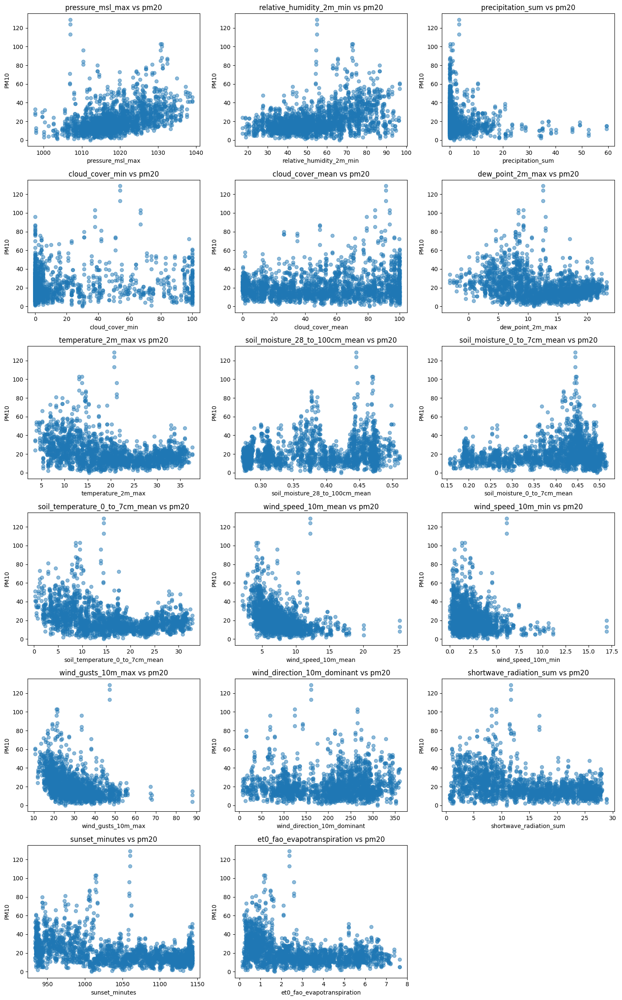

In [212]:
n = len(list_var_num)
cols = 3
rows = math.ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 4))
axes = axes.flatten()

for i, col in enumerate(list_var_num):
    axes[i].scatter(df_finale[col], df_finale['PM10'], alpha=0.5)
    axes[i].set_title(f'{col} vs pm20')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('PM10')

# elimina assi vuoti
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

### Information Value confronto PM10


L'IV serve per la feature selection.
Compara la distribuzione delle variabili per la target con la distribuzione per la non target.

Ha un vaore che va da zero a infinito -> valori alti = più forte capacità predittiva

Formula:
IV = ∑ (Good Distribution — Bad Distribution) * Weight of Evidence

+ Good distribution: % nella distribuzione per cui la target è 0 dato un valore della feature
+ Bad distribution: % nella distribuzione per cui la target è 1 dato un valore della feature
+ Weight of Evidence = ln(Good Distribution/Bad Distribution) -> se è positivo ci sono più zeri che 1, se è negativo è il contrario

WOE - Come calcolarla:
Dividi in bins le variabili numeriche
Calcola il numero di eventi e non-eventi in ogni gruppo (eventi: pm10 > 50)
Calcola le % di eventi e non eventi in ogni gruppo
Calcola il WOE dividendo % di non-event a quella di eventi

IV
Less than 0.02	Not useful for prediction
0.02 to 0.1	Weak predictive Power
0.1 to 0.3	Medium predictive Power
0.3 to 0.5	Strong predictive Power
oltre 0.5	Suspicious Predictive Power

In [213]:
features = list_var_num
target = 'target_pm10'  # 1 = sopra soglia, 0 = sotto

# prendi solo le colonne che ti servono
df_sub = df_finale[features + [target]]

# calcolo IV solo su queste
iv_df = sc.iv(df_sub, y=target)

In [214]:
iv_df.head(20).style.background_gradient(vmin=0, vmax=.5).format(precision=2)

,variable,info_value
1,cloud_cover_min,1.43
11,wind_gusts_10m_max,0.93
15,precipitation_sum,0.86
8,pressure_msl_max,0.77
16,wind_speed_10m_min,0.63
6,soil_moisture_28_to_100cm_mean,0.62
12,sunset_minutes,0.59
4,dew_point_2m_max,0.55
13,temperature_2m_max,0.47
10,cloud_cover_mean,0.35


### Confronto e scelta

confronto le correlazioni, le associazioni e la capacità predittiva rispetto al PM10

In [215]:
display(
    iv_df.head(20).style.background_gradient(vmin=0, vmax=.5).format(precision=2),
    df_couples.head(20).style.background_gradient(vmin=0, vmax=.3).format(precision=2),
    df_corr_p.head(20).style.background_gradient(vmin=0, vmax=.3).format(precision=2),
    df_corr_s.head(20).style.background_gradient(vmin=0, vmax=.3).format(precision=2)

)

,variable,info_value
1,cloud_cover_min,1.43
11,wind_gusts_10m_max,0.93
15,precipitation_sum,0.86
8,pressure_msl_max,0.77
16,wind_speed_10m_min,0.63
6,soil_moisture_28_to_100cm_mean,0.62
12,sunset_minutes,0.59
4,dew_point_2m_max,0.55
13,temperature_2m_max,0.47
10,cloud_cover_mean,0.35


,var-x,var-y,v-score
9,wind_speed_10m_mean,target_pm10,0.32
11,sunset_minutes,target_pm10,0.29
4,soil_moisture_28_to_100cm_mean,target_pm10,0.28
6,soil_moisture_0_to_7cm_mean,target_pm10,0.27
1,relative_humidity_2m_min,target_pm10,0.25
10,shortwave_radiation_sum,target_pm10,0.25
12,wind_gusts_10m_max,target_pm10,0.24
7,soil_temperature_0_to_7cm_mean,target_pm10,0.24
14,et0_fao_evapotranspiration,target_pm10,0.23
5,temperature_2m_max,target_pm10,0.23


,varA,correlation,varB
0,relative_humidity_2m_min,0.22,target_pm10
1,soil_temperature_0_to_7cm_mean,0.20,target_pm10
2,temperature_2m_max,0.19,target_pm10
3,et0_fao_evapotranspiration,0.19,target_pm10
4,shortwave_radiation_sum,0.19,target_pm10
5,wind_speed_10m_mean,0.19,target_pm10
6,sunset_minutes,0.18,target_pm10
7,wind_gusts_10m_max,0.16,target_pm10
8,cloud_cover_mean,0.16,target_pm10
9,dew_point_2m_max,0.15,target_pm10


,varA,correlation,varB
0,wind_speed_10m_mean,0.23,target_pm10
1,relative_humidity_2m_min,0.22,target_pm10
2,soil_temperature_0_to_7cm_mean,0.21,target_pm10
3,et0_fao_evapotranspiration,0.20,target_pm10
4,temperature_2m_max,0.20,target_pm10
5,wind_gusts_10m_max,0.19,target_pm10
6,shortwave_radiation_sum,0.19,target_pm10
7,sunset_minutes,0.17,target_pm10
8,dew_point_2m_max,0.16,target_pm10
9,cloud_cover_mean,0.16,target_pm10


Vediamo che alcune variabili sono molto correlate tra loro e alcune sono molto utili da sole o insieme per predire il PM10. 
Sono poche quelle da togliere. 

precipitation_sum e weather_description sembrano essere molto correlate (v-score)
Mi chiedo se abbia senso tenere questa variabile categorica di weather description quando ho tutte queste variabili quantitative che a tutti gli effetti sono la descrizione meteo. Decido di toglierla


In [216]:
df_finale.to_parquet(os.path.join("..","data", "df.parquet"), index=False)

In [217]:
list_var_num

['pressure_msl_max',
 'relative_humidity_2m_min',
 'precipitation_sum',
 'cloud_cover_min',
 'cloud_cover_mean',
 'dew_point_2m_max',
 'temperature_2m_max',
 'soil_moisture_28_to_100cm_mean',
 'soil_moisture_0_to_7cm_mean',
 'soil_temperature_0_to_7cm_mean',
 'wind_speed_10m_mean',
 'wind_speed_10m_min',
 'wind_gusts_10m_max',
 'wind_direction_10m_dominant',
 'shortwave_radiation_sum',
 'sunset_minutes',
 'et0_fao_evapotranspiration']